In [2]:
#Orignal location of the parq file:
#scp /oak/stanford/groups/akundaje/avsec/basepair/data/processed/comparison/output/nexus,peaks,OSNK,0,10,1,FALSE,same,0.5,64,25,0.004,9,FALSE,[1,50],TRUE,FALSE,1/deeplift/Nanog/out/profile/wn/instances.parq

# conda install -c conda-forge python-snappy
# pip install fastparquet

import pandas as pd


def shorten_pattern(pattern):
    """metacluster_0/pattern_1 -> m1_p1
    """
    if "/" not in pattern:
        # input is already a short pattern
        return pattern
    else:
        # two slashes -> prepended name
        return pattern.replace("metacluster_", "m").replace("/pattern_", "_p")

    
def load_instances(parq_file, motifs=None, dedup=True, verbose=True):
    """Load pattern instances from the parquet file
    Args:
      parq_file: parquet file of motif instances
      motifs: dictionary of motifs of interest.
        key=custom motif name, value=short pattern name (e.g. {'Nanog': 'm0_p3'})
    """
    if motifs is not None:
        incl_motifs = {longer_pattern(m) for m in motifs.values()}
    else:
        incl_motifs = None

    if isinstance(parq_file, pd.DataFrame):
        dfi = parq_file
    else:
        if motifs is not None:
            from fastparquet import ParquetFile

            # Selectively load only the relevant patterns
            pf = ParquetFile(str(parq_file))
            patterns = [shorten_pattern(pn) for pn in incl_motifs]
            dfi = pf.to_pandas(filters=[("pattern_short", "in", patterns)])
        else:
            dfi = pd.read_parquet(str(parq_file), engine='fastparquet')
            if 'pattern' not in dfi:
                # assumes a hive-stored file
                dfi['pattern'] = dfi['dir0'].str.replace("pattern=", "").astype(str) + "/" + dfi['dir1'].astype(str)

    # filter
    if motifs is not None:
        dfi = dfi[dfi.pattern.isin(incl_motifs)]  # NOTE this should already be removed
        if 'pattern_short' not in dfi:
            dfi['pattern_short'] = dfi['pattern'].map({k: shorten_pattern(k) for k in incl_motifs})
        dfi['pattern_name'] = dfi['pattern_short'].map({v: k for k, v in motifs.items()})
    else:
        dfi['pattern_short'] = dfi['pattern'].map({k: shorten_pattern(k)
                                                   for k in dfi.pattern.unique()})

    # add some columns if they don't yet exist
    if 'pattern_start_abs' not in dfi:
        dfi['pattern_start_abs'] = dfi['example_start'] + dfi['pattern_start']
    if 'pattern_end_abs' not in dfi:
        dfi['pattern_end_abs'] = dfi['example_start'] + dfi['pattern_end']

    if dedup:
        # deduplicate
        dfi_dedup = dfi.drop_duplicates(['pattern',
                                         'example_chrom',
                                         'pattern_start_abs',
                                         'pattern_end_abs',
                                         'strand'])

        # number of removed duplicates
        d = len(dfi) - len(dfi_dedup)
        if verbose:
            print("number of de-duplicated instances:", d, f"({d / len(dfi) * 100}%)")

        # use de-duplicated instances from now on
        dfi = dfi_dedup
    return dfi


dfi = load_instances("instances.parq")

number of de-duplicated instances: 2694133 (35.71251703021204%)


In [3]:
dfi

,example_idx,pattern_start,pattern_end,strand,pattern_center,pattern_len,match_weighted,match_weighted_p,match_weighted_cat,match_max,...,example_start,example_end,example_strand,example_interval_from_task,dir0,dir1,pattern,pattern_short,pattern_start_abs,pattern_end_abs
index,,,,,,,,,,,,,,,,,,,,,
0,0,190,199,+,195,9,0.377272,0.063739,low,0.377272,...,3001633,3002633,.,Oct4,pattern=metacluster_0,pattern_0,metacluster_0/pattern_0,m0_p0,3001823,3001832
1,0,199,208,+,204,9,0.258843,0.001004,low,0.258843,...,3001633,3002633,.,Oct4,pattern=metacluster_0,pattern_0,metacluster_0/pattern_0,m0_p0,3001832,3001841
2,0,229,238,-,233,9,0.317049,0.013300,low,0.317049,...,3001633,3002633,.,Oct4,pattern=metacluster_0,pattern_0,metacluster_0/pattern_0,m0_p0,3001862,3001871
3,0,294,303,+,299,9,0.261117,0.001004,low,0.261117,...,3001633,3002633,.,Oct4,pattern=metacluster_0,pattern_0,metacluster_0/pattern_0,m0_p0,3001927,3001936
4,0,327,336,+,332,9,0.282226,0.002760,low,0.282226,...,3001633,3002633,.,Oct4,pattern=metacluster_0,pattern_0,metacluster_0/pattern_0,m0_p0,3001960,3001969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7278994,142491,13,83,+,48,70,0.151552,0.018072,low,0.151552,...,118635245,118636245,.,Klf4,pattern=metacluster_0,pattern_9,metacluster_0/pattern_9,m0_p9,118635258,118635328
7278997,142799,537,607,+,572,70,0.250622,0.120482,low,0.250622,...,178300934,178301934,.,Klf4,pattern=metacluster_0,pattern_9,metacluster_0/pattern_9,m0_p9,178301471,178301541
7279008,145244,261,331,+,296,70,0.159075,0.018072,low,0.159075,...,65288020,65289020,.,Klf4,pattern=metacluster_0,pattern_9,metacluster_0/pattern_9,m0_p9,65288281,65288351


In [20]:
dfi["seq_match"]

index
0           2.140131
1           0.473173
2           0.108915
3           2.300180
4           3.364320
             ...    
7278994     2.328424
7278997    46.972285
7279008    13.185649
7279010     0.090452
7279014    64.752712
Name: seq_match, Length: 4849813, dtype: float64

In [25]:
max(dfi["example_idx"][dfi["pattern"]=="metacluster_0/pattern_0"])

147973

In [16]:
import h5py
import numpy as np

f = h5py.File("deeplift.imp_score.h5","r")
nanog_mask = np.array(f['metadata']['interval_from_task'][:]=='Nanog')
nanog_profile_wn_hypimp = np.array(f["hyp_imp/Nanog/profile/wn"][:])[nanog_mask]
onehot_seq = np.array(f["inputs/seq"][:])[nanog_mask]
nanog_profile_wn_contribs = nanog_profile_wn_hypimp*onehot_seq


In [17]:
import modisco

track_set = modisco.tfmodisco_workflow.workflow.prep_track_set(
    task_names=["Nanog_profile_wn"],
    contrib_scores={'Nanog_profile_wn': nanog_profile_wn_contribs},
    hypothetical_contribs={'Nanog_profile_wn': nanog_profile_wn_hypimp},
    one_hot=onehot_seq)

#scp /oak/stanford/groups/akundaje/avsec/basepair/data/processed/comparison/output/nexus,peaks,OSNK,0,10,1,FALSE,same,0.5,64,25,0.004,9,FALSE,[1,50],TRUE,FALSE,1/deeplift/Nanog/out/profile/wn/modisco.h5
grp = h5py.File("modisco.h5","r")
loaded_tfmodisco_results =\
    modisco.tfmodisco_workflow.workflow.TfModiscoResults.from_hdf5(grp, track_set=track_set)
grp.close()
patterns = (loaded_tfmodisco_results
            .metacluster_idx_to_submetacluster_results["metacluster_0"]
            .seqlets_to_patterns_result.patterns)

TF-MoDISco is using the TensorFlow backend.
/users/avanti/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/users/avanti/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/users/avanti/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/users/avanti/anaconda3/lib/python3

Getting the exemplar motifs
Numseqlets: 4011
Time taken: 88.50218486785889


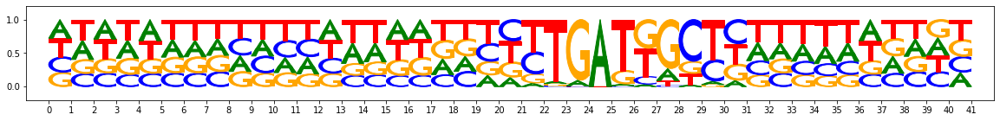

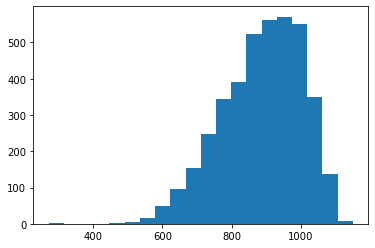

After filtering: numseqlets 4000


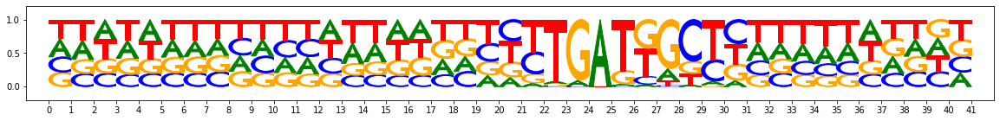

Numseqlets: 2215
Time taken: 26.133495092391968


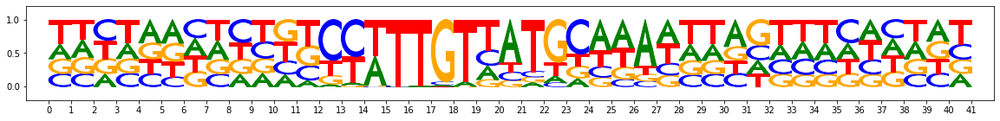

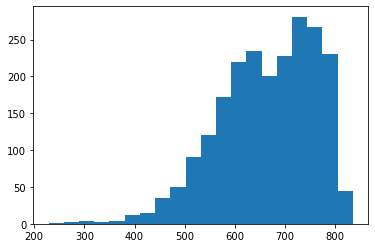

After filtering: numseqlets 2193


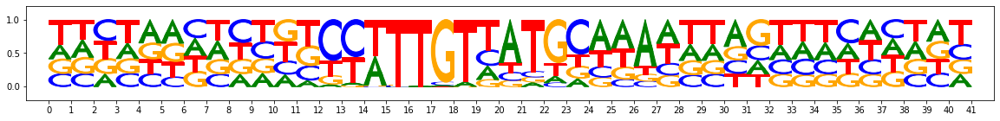

Numseqlets: 1854
Time taken: 18.747823238372803


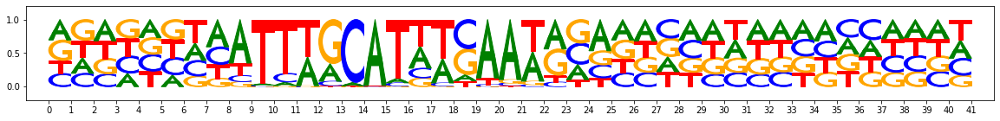

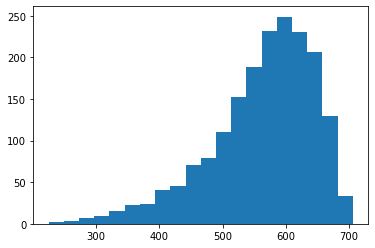

After filtering: numseqlets 1817


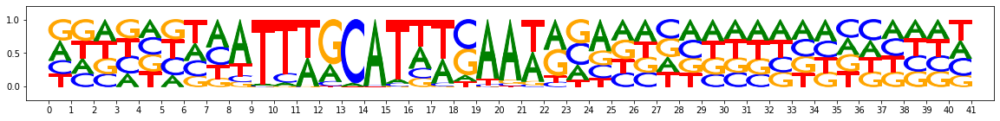

Numseqlets: 1636
Time taken: 14.2986421585083


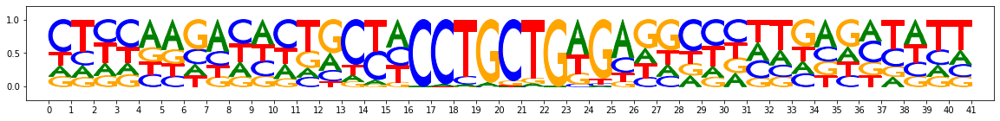

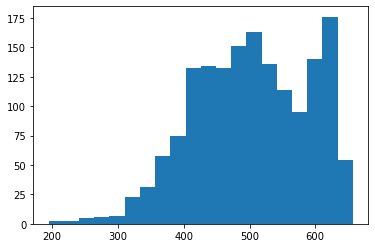

After filtering: numseqlets 1618


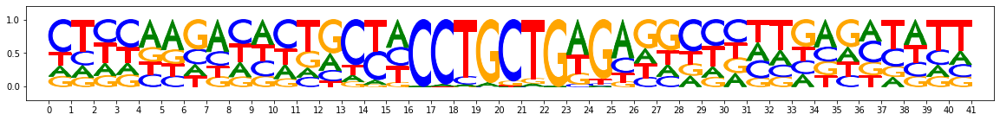

Numseqlets: 937
Time taken: 4.8665771484375


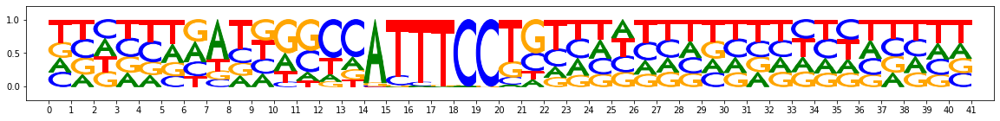

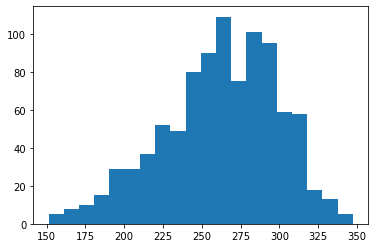

After filtering: numseqlets 934


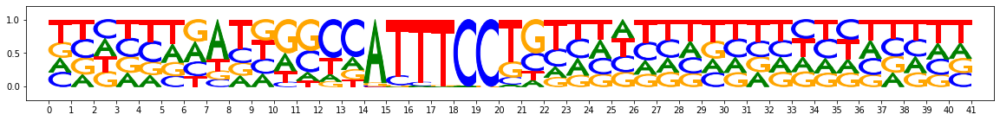

Numseqlets: 749
Time taken: 2.9183571338653564


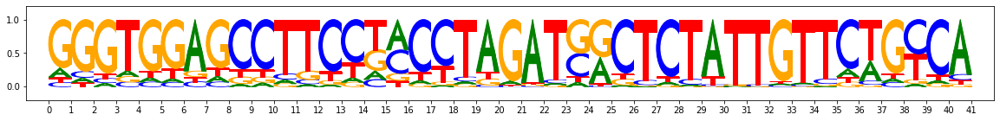

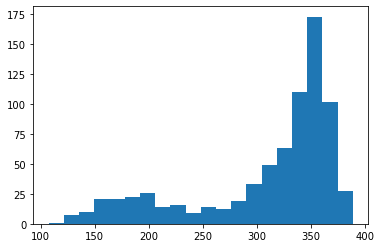

After filtering: numseqlets 645


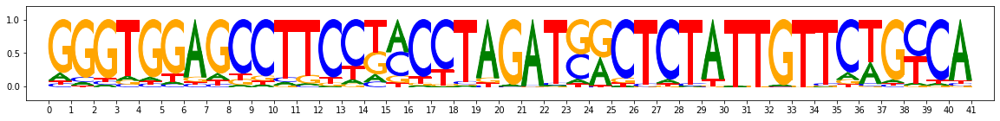

Numseqlets: 466
Time taken: 1.307030439376831


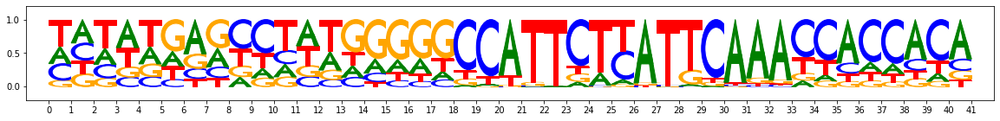

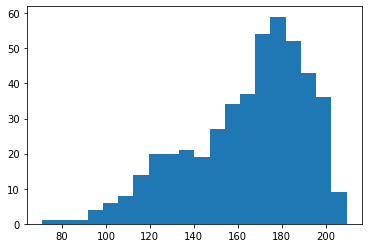

After filtering: numseqlets 457


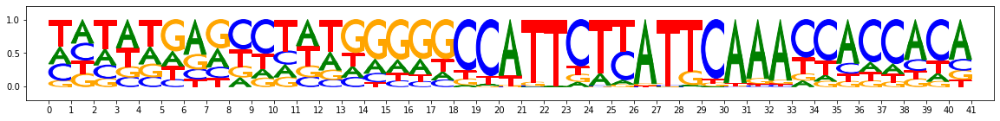

Numseqlets: 231
Time taken: 0.3578681945800781


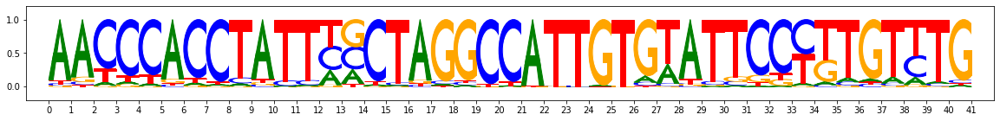

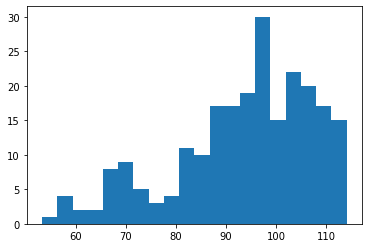

After filtering: numseqlets 227


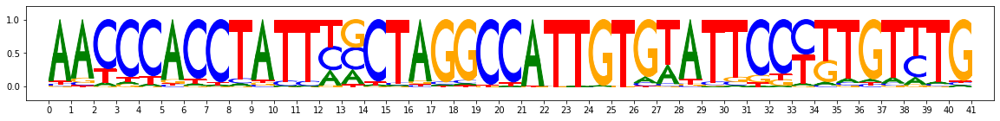

Numseqlets: 191
Time taken: 0.24232745170593262


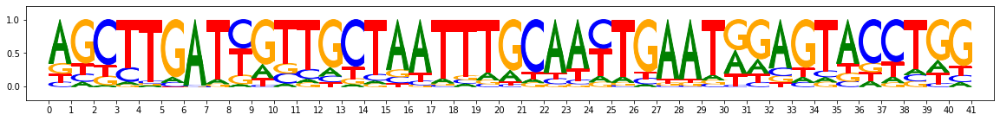

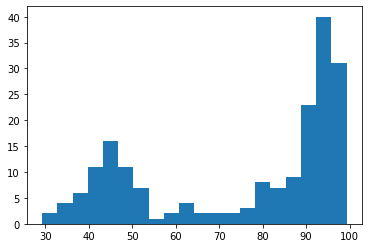

After filtering: numseqlets 135


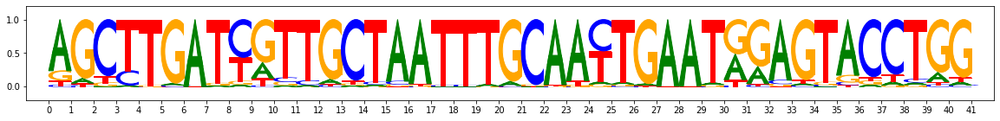

Numseqlets: 187
Time taken: 0.24190235137939453


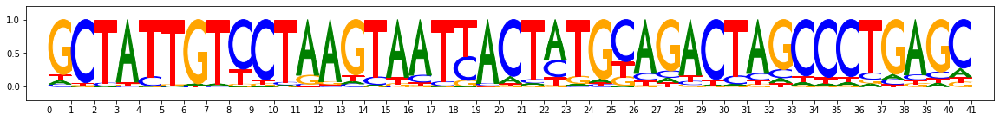

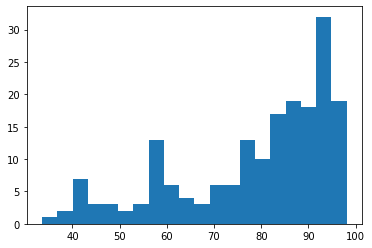

After filtering: numseqlets 170


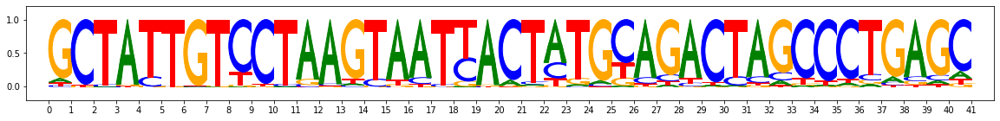

Numseqlets: 142
Time taken: 0.1486804485321045


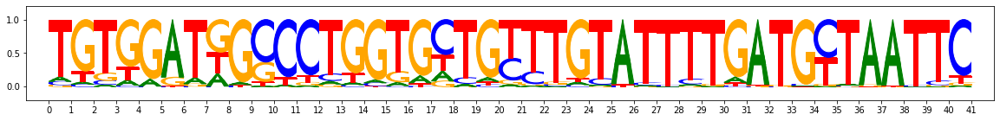

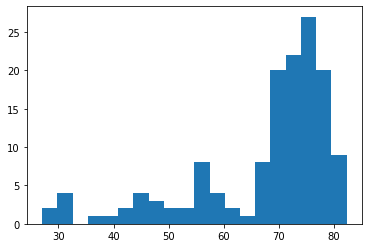

After filtering: numseqlets 132


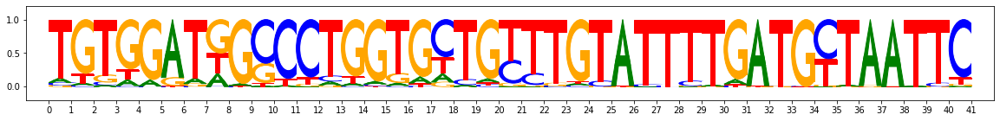

Numseqlets: 117
Time taken: 0.11572980880737305


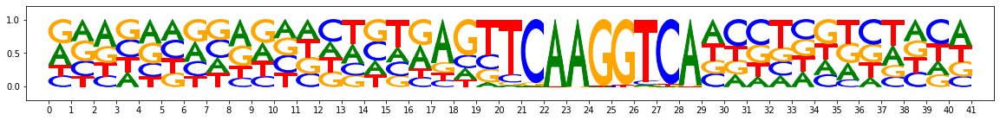

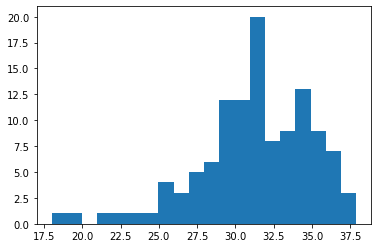

After filtering: numseqlets 116


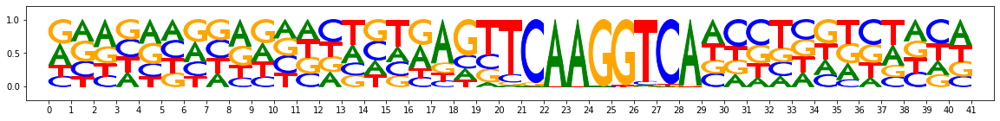

Numseqlets: 89
Time taken: 0.06796455383300781


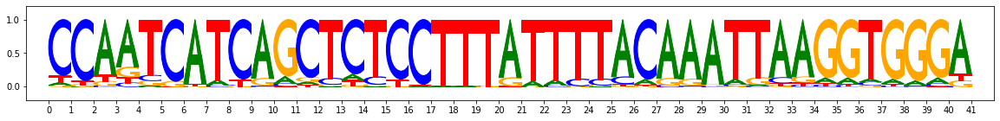

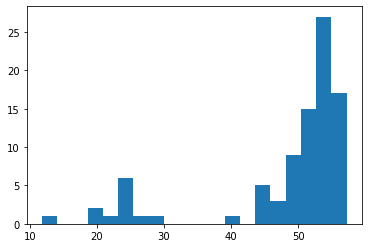

After filtering: numseqlets 77


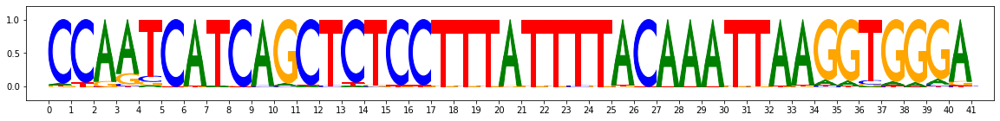

Numseqlets: 105
Time taken: 0.09593725204467773


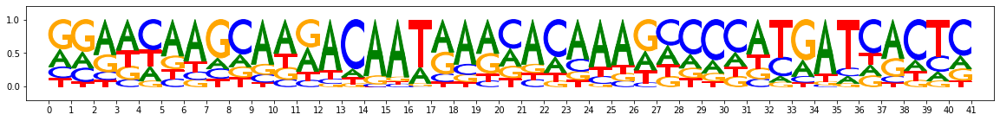

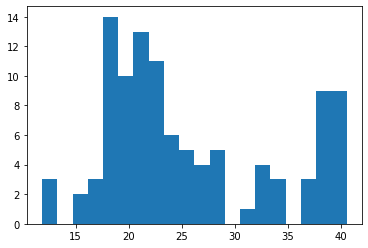

After filtering: numseqlets 102


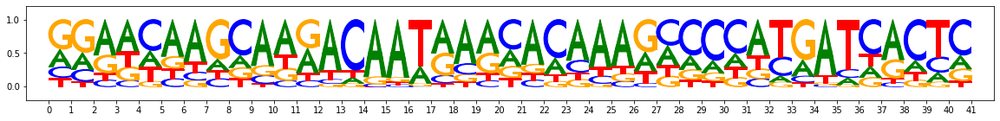

Numseqlets: 105
Time taken: 0.09430456161499023


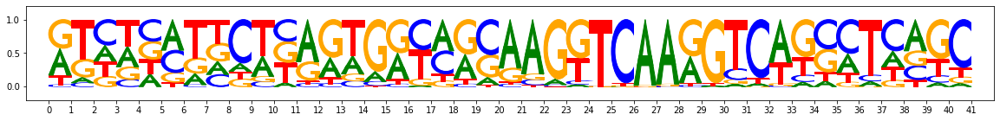

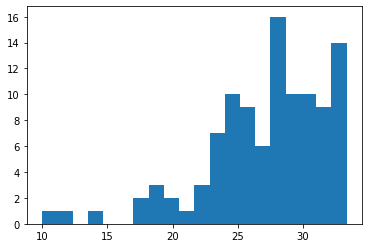

After filtering: numseqlets 102


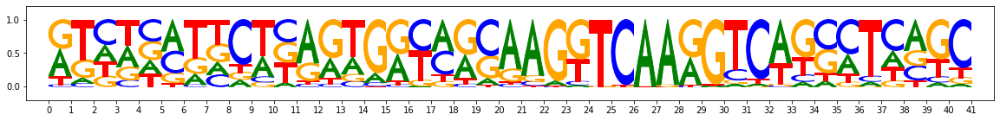

Numseqlets: 65
Time taken: 0.04404902458190918


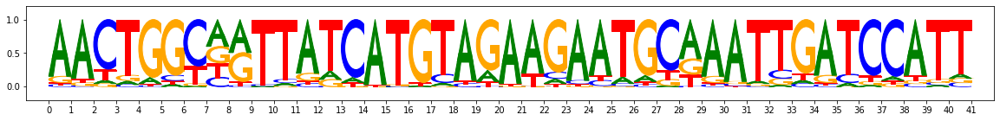

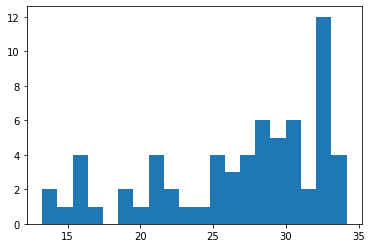

After filtering: numseqlets 58


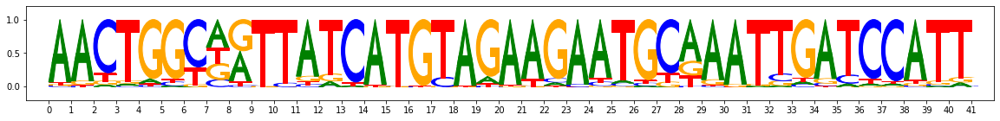

In [30]:
from collections import defaultdict
from modisco.visualization import viz_sequence
import time
from matplotlib import pyplot as plt


def flatten_seqlet_impscore_features(seqlet_impscores):
    return np.reshape(seqlet_impscores, (len(seqlet_impscores), -1))


def facility_locator(distmat, num_exemplars):
    exemplars = [] 
    current_bestrep = np.inf*np.ones(distmat.shape[0])
    for i in range(min(num_exemplars, len(distmat))):
        candidate_newbestrep = np.minimum(distmat, current_bestrep[None,:])  
        candidate_objective = np.sum(candidate_newbestrep, axis=-1) 
        next_best_exemplar = np.argmin(candidate_objective) 
        exemplars.append(next_best_exemplar)
        current_bestrep = candidate_newbestrep[next_best_exemplar]
    return exemplars


def compute_continjacc_sims_1vmany(vec1, vecs2, vecs2_weighting):
    sign_vec1, signs_vecs2 = np.sign(vec1), np.sign(vecs2)
    abs_vec1, abs_vecs2 = np.abs(vec1), np.abs(vecs2)
    intersection = np.sum((np.minimum(abs_vec1[None,:], abs_vecs2[:,:])
                           *sign_vec1[None,:]*signs_vecs2[:,:])*vecs2_weighting, axis=-1)
    union = np.sum(np.maximum(abs_vec1[None,:], abs_vecs2[:,:])*vecs2_weighting, axis=-1)
    return intersection/union


def compute_pairwise_continjacc_sims(vecs1, vecs2, vecs2_weighting=None):
    #normalize vecs2_weighting to sum to 1
    if (vecs2_weighting is None):
        vecs2_weighting = np.ones_like(vecs2)
    assert np.min(vecs2_weighting) >= 0
    return np.array([compute_continjacc_sims_1vmany(
                         vec1=vec1, vecs2=vecs2,
                         vecs2_weighting=vecs2_weighting)
                     for vec1 in vecs1])
    #compute the pairwise continjacc sims between the vecs
    #signs_vecs1, signs_vecs2 = np.sign(vecs1), np.sign(vecs2)
    #absvals_vecs1, absvals_vecs2 = np.abs(vecs1), np.abs(vecs2)
    #intersection = np.sum(np.minimum(absvals_vecs1[:,None,:], absvals_vecs2[None,:,:])
    #                      *signs_vecs1[:,None,:]*signs_vecs2[None,:,:], axis=-1)
    #union = np.sum(np.maximum(absvals_vecs1[:,None,:], absvals_vecs2[None,:,:]), axis=-1)
    #return intersection/union 
    
    
def make_aggregated_seqlet(seqlets):
    seqletsandalignments = modisco.core.SeqletsAndAlignments()
    [seqletsandalignments.append(modisco.core.SeqletAndAlignment(
        seqlet=seqlet,
        alnmt=0)) for seqlet in seqlets if seqlet not in seqletsandalignments]
    reconstructed_motif = modisco.core.AggregatedSeqlet(seqletsandalignments)
    return reconstructed_motif

    
def get_exemplar_aggseqlets(seqlets, pattern_comparison_settings,
                            seqlets_per_exemplar, max_exemplars,
                            affmat_min_frac_of_median):
    print("Numseqlets:", len(seqlets))
    #seqlets should already be aligned relative to each other
    #extract the features
    fwd_seqlet_data, _ = modisco.core.get_2d_data_from_patterns(
        patterns=seqlets,
        track_names=pattern_comparison_settings.track_names,
        track_transformer=
         pattern_comparison_settings.track_transformer)
    #flatten the fwd_seqlet_data
    fwd_seqlet_data_vectors = flatten_seqlet_impscore_features(fwd_seqlet_data)
    #compute the affinity matrix
    orig_affmat = compute_pairwise_continjacc_sims(vecs1=fwd_seqlet_data_vectors,
                                              vecs2=fwd_seqlet_data_vectors)
    #Let's kick out seqlets for which the sum of the affmat across all
    # neighbors is less than affmat_min_frac_of_median
    sum_orig_affmat = np.sum(orig_affmat, axis=-1)
    median_sum_affmat = np.median(sum_orig_affmat)
    passing_mask = (sum_orig_affmat > affmat_min_frac_of_median*median_sum_affmat)
    
    #get a new affmat and seqlets that are subsetted
    affmat = orig_affmat[passing_mask,:][:,passing_mask]
    seqlets = [seqlet for seqlet,is_passing in zip(seqlets, passing_mask)
               if is_passing]
    filtered_orig_motif = make_aggregated_seqlet(seqlets)
    
    
    #convert to distance matrix
    distmat = 1/( np.maximum(affmat,1e-7) )
    #get exemplars
    seqlet_exemplar_indices = facility_locator(
        distmat=distmat,
        num_exemplars=min(max_exemplars, int(np.ceil(len(seqlets)/seqlets_per_exemplar)) ))
    #aggregate over the similar ones, return the aggseqlets
    representive_exemplars = np.argmax(affmat[:, seqlet_exemplar_indices],
                                         axis=-1)
    exemplar_to_seqletsandalignments =\
        defaultdict(lambda: modisco.core.SeqletsAndAlignments())
    for seqlet, representive_exemplar in zip(seqlets, representive_exemplars):
        exemplar_to_seqletsandalignments[representive_exemplar].append(
            modisco.core.SeqletAndAlignment(seqlet=seqlet, alnmt=0) )
    exemplar_to_motif = dict([
        (exemplar, modisco.core.AggregatedSeqlet(seqletsandalignments))
        for exemplar,seqletsandalignments in exemplar_to_seqletsandalignments.items()])
    motifs = [exemplar_to_motif[i] for i in sorted(exemplar_to_motif.keys())]
    
    return motifs, affmat, filtered_orig_motif, sum_orig_affmat
    

#for building the classifiers:
PATTERN_COMPARISON_SETTINGS =\
            modisco.affinitymat.core.PatternComparisonSettings(                         
                track_names=["Nanog_profile_wn_hypothetical_contribs",
                             "Nanog_profile_wn_contrib_scores"],                      
                track_transformer=modisco.affinitymat.L1Normalizer(),                   
                min_overlap=0.7)

BG_FREQ = np.mean(onehot_seq, axis=(0,1))
AFFMAT_MIN_FRAC_OF_MEDIAN = 0.6

#start by trimming the patterns to the lengths of the original seqlets
prefilt_trimmed_patterns = modisco.aggregator.TrimToBestWindowByIC(                                    
                    window_size=41,                           
                    onehot_track_name="sequence",                            
                    bg_freq=BG_FREQ)(patterns)

print("Getting the exemplar motifs")
#Take each pattern
#Identify some number of exemplars and aggregate around them
exemplarmotifs_foreach_pattern = []
withinpattern_affmats = []
trimmed_patterns = []
for pattern in prefilt_trimmed_patterns:
    start = time.time()
    exemplarmotifs, patternaffmat, filtered_orig_motif, sum_orig_affmat = get_exemplar_aggseqlets(
      seqlets=pattern.seqlets,
      pattern_comparison_settings=PATTERN_COMPARISON_SETTINGS,
      seqlets_per_exemplar=30,
      max_exemplars=10,
      affmat_min_frac_of_median = AFFMAT_MIN_FRAC_OF_MEDIAN)
    print("Time taken:", time.time()-start)
    exemplarmotifs_foreach_pattern.append(exemplarmotifs)
    withinpattern_affmats.append(patternaffmat)
    trimmed_patterns.append(filtered_orig_motif)
    
    viz_sequence.plot_weights(pattern["sequence"].fwd)
    plt.hist(sum_orig_affmat, bins=20)
    plt.show()
    print("After filtering: numseqlets", len(filtered_orig_motif.seqlets))
    viz_sequence.plot_weights(filtered_orig_motif["sequence"].fwd)
    

#Trim to the width used for seqlets
# Positive set: seqlets correctly centered.
# Negative set: seqlets in other motifs + unaligned seqlets
#Score with ALL seqlets & train SVM

In [115]:
#gets the shifts of the provided coordinate - everything except 0
def get_shifts(seqlet_coordinate, shift_fraction, max_seq_len):
    shift_size_in_bp = int((seqlet_coordinate.end-
                            seqlet_coordinate.start)*shift_fraction)
    coordinates_to_return = []
    for shift_size in range(-shift_size_in_bp,shift_size_in_bp+1):
        new_start = seqlet_coordinate.start + shift_size
        new_end = seqlet_coordinate.end + shift_size
        if (new_start >= 0 and new_end <= max_seq_len):
            coordinates_to_return.append(modisco.core.SeqletCoordinates(
                example_idx=seqlet_coordinate.example_idx,
                start=new_start,
                end=new_end,
                is_revcomp=seqlet_coordinate.is_revcomp))
    return coordinates_to_return

print("Getting labels")
all_coordinates = [
    coor
    for pattern in trimmed_patterns
    for seqlet in pattern.seqlets
    for coor in get_shifts(seqlet_coordinate=seqlet.coor, shift_fraction=0.3,
                           max_seq_len=len(onehot_seq[seqlet.coor.example_idx]))
]
patternidx_to_positivecoordinates = dict([
    (patternidx, set(str(seqlet.coor) for seqlet in trimmed_patterns[patternidx].seqlets))
    for patternidx in range(len(trimmed_patterns))
])
#get the labels for the coordinates depending on the patterns
labels = np.zeros((len(all_coordinates), len(trimmed_patterns)))
for patternidx in range(len(trimmed_patterns)):
    labels[:,patternidx] = np.array([
        1 if str(coor) in patternidx_to_positivecoordinates[patternidx] else 0
        for coor in all_coordinates ])

print("Creating seqlets")
all_coordinates_seqlets = track_set.create_seqlets(coords=all_coordinates)
all_exemplarmotifs = []
pattern_to_exemplarmotifsidxs = [0]
for patternidx in range(len(trimmed_patterns)):
    all_exemplarmotifs.extend(exemplarmotifs_foreach_pattern[patternidx])
    pattern_to_exemplarmotifsidxs.append(
        pattern_to_exemplarmotifsidxs[-1]+
        len(exemplarmotifs_foreach_pattern[patternidx]))

all_exemplarmotifs = [exemplarmotif
    for patternidx in range(len(trimmed_patterns)) 
    for exemplarmotif in exemplarmotifs_foreach_pattern[patternidx]]

print("Getting impscores data")
#get features for each pattern based on similarity to exemplars.
#first get the importance scores and such
allcoordinatesseqlet_impscoresdata_fwd, _ =\
    modisco.core.get_2d_data_from_patterns(
        patterns=all_coordinates_seqlets,
        track_names=PATTERN_COMPARISON_SETTINGS.track_names,
        track_transformer=PATTERN_COMPARISON_SETTINGS.track_transformer)

allexemplarmotifs_impscoresdata_fwd, _ =\
    modisco.core.get_2d_data_from_patterns(
        patterns=all_exemplarmotifs,
        track_names=PATTERN_COMPARISON_SETTINGS.track_names,
        track_transformer=PATTERN_COMPARISON_SETTINGS.track_transformer)

allexemplarmotifs_contribscores_fwd, _ =\
    modisco.core.get_2d_data_from_patterns(
        patterns=all_exemplarmotifs,
        track_names=["Nanog_profile_wn_contrib_scores"],
        track_transformer=PATTERN_COMPARISON_SETTINGS.track_transformer)

allexemplarmotifs_hypcontribs_fwd, _ =\
    modisco.core.get_2d_data_from_patterns(
        patterns=all_exemplarmotifs,
        track_names=["Nanog_profile_wn_hypothetical_contribs"],
        track_transformer=PATTERN_COMPARISON_SETTINGS.track_transformer)



allcoordinatesseqlet_sequence_fwd, _ =\
    modisco.core.get_2d_data_from_patterns(
        patterns=all_coordinates_seqlets,
        track_names=["sequence"],
        track_transformer=lambda x: x)

allexemplarmotifs_sequence_fwd, _ =\
    modisco.core.get_2d_data_from_patterns(
        patterns=all_exemplarmotifs,
        track_names=["sequence"],
        track_transformer=lambda x: x)

allexemplarmotifs_sequence_fwd_logodds = np.array([
    modisco.util.get_logodds_pwm(
        ppm=x,
        background=BG_FREQ,
        pseudocount=0.001
    ) for x in allexemplarmotifs_sequence_fwd ])

#compute the log-odds scores for all exemplars
print("Computing PPM log-odds scores")
start = time.time()
logodds_matrix_fwd = np.array([
    np.sum(allexemplarmotifs_sequence_fwd_logodds*x[None,:,:], axis=(1,2))
    for x in allcoordinatesseqlet_sequence_fwd ])
print("Took",time.time()-start,"seconds")

allcoordinatesseqlet_impscoresdata_fwd = (
    flatten_seqlet_impscore_features(allcoordinatesseqlet_impscoresdata_fwd))
allexemplarmotifs_impscoresdata_fwd =(
    flatten_seqlet_impscore_features(allexemplarmotifs_impscoresdata_fwd))

#compute the per-position IC, then tile and flatten to
# get it into vector form.
per_position_ic_allexemplarmotifs_fwd =\
    np.maximum(flatten_seqlet_impscore_features(np.array([
        np.tile(modisco.util.compute_per_position_ic(
            ppm=x,
            background=BG_FREQ,
            pseudocount=0.001)[:,None],
          (1,4*len(PATTERN_COMPARISON_SETTINGS.track_names)))
        for x in allexemplarmotifs_sequence_fwd])),0)

import time
start = time.time()
print("Computing fwd sims")
continjacc_matrix_fwd = compute_pairwise_continjacc_sims(
    vecs1=allcoordinatesseqlet_impscoresdata_fwd,
    vecs2=allexemplarmotifs_impscoresdata_fwd,
    vecs2_weighting=per_position_ic_allexemplarmotifs_fwd)
print("Took",time.time()-start,"s")
start = time.time()


Getting labels
Creating seqlets
Getting impscores data
Computing log-odds scores
Took 19.68452501296997 seconds
Computing fwd sims
Took 301.4448938369751 s


In [108]:
"""import keras
import tensorflow as tf
def initialize_scoring_network(exemplarmotifs_impscoresdata_fwd,
                               exemplarmotifs_sequence_fwd,
                               per_position_ic_exemplarmotifs_weightings):
    #will be used to rescale the total importance
    average_per_position_weighting = np.mean(per_position_ic_exemplarmotifs_weightings,
                                             axis=0)
    input_tensor_scores = keras.layers.Input((41,8))
    #rescale the input by the weighted magnitude squared
    input_rescaled = keras.layers.Lambda(
        lambda x: x/tf.reduce_sum(x*x*average_per_position_weighting,
                                  axis=(1,2))[:,None,None] )(input_tensor)
pattern_to_exemplarmotifsidxs"""




'import keras\nimport tensorflow as tf\ndef initialize_scoring_network(exemplarmotifs_impscoresdata_fwd,\n                               exemplarmotifs_sequence_fwd,\n                               per_position_ic_exemplarmotifs_weightings):\n    #will be used to rescale the total importance\n    average_per_position_weighting = np.mean(per_position_ic_exemplarmotifs_weightings,\n                                             axis=0)\n    input_tensor_scores = keras.layers.Input((41,8))\n    #rescale the input by the weighted magnitude squared\n    input_rescaled = keras.layers.Lambda(\n        lambda x: x/tf.reduce_sum(x*x*average_per_position_weighting,\n                                  axis=(1,2))[:,None,None] )(input_tensor)\npattern_to_exemplarmotifsidxs'

In [120]:
features_matrix.shape

(319575, 222)

(array([1.16321e+05, 7.19910e+04, 3.99100e+04, 2.01400e+04, 1.14410e+04,
        6.71200e+03, 3.21200e+03, 1.88700e+03, 1.34300e+03, 7.76000e+02,
        6.01000e+02, 6.14000e+02, 5.87000e+02, 5.63000e+02, 5.04000e+02,
        3.98000e+02, 3.45000e+02, 2.59000e+02, 2.16000e+02, 7.90000e+01]),
 array([1.64711447e-06, 4.24831176e-02, 8.49645880e-02, 1.27446058e-01,
        1.69927529e-01, 2.12408999e-01, 2.54890470e-01, 2.97371940e-01,
        3.39853411e-01, 3.82334881e-01, 4.24816351e-01, 4.67297822e-01,
        5.09779292e-01, 5.52260763e-01, 5.94742233e-01, 6.37223704e-01,
        6.79705174e-01, 7.22186645e-01, 7.64668115e-01, 8.07149585e-01,
        8.49631056e-01]),
 <a list of 20 Patch objects>)

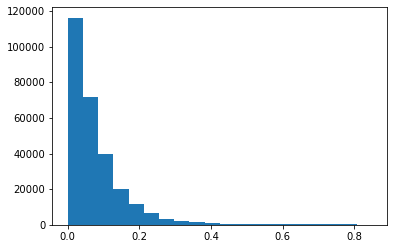

In [122]:
plt.hist(features_matrix[:,0][features_matrix[:,0] > 0], bins=20)

In [136]:
import sklearn

pattern_to_classifierinfo = {}

# build a separate classifier for each motif
for pattern_idx in range(len(trimmed_patterns)):
    print("On pattern idx",pattern_idx)
    features_slice = pattern_to_exemplarmotifsidxs[pattern_idx:pattern_idx+2]
    continjacc_matrix_slice = continjacc_matrix_fwd[:,features_slice[0]:features_slice[1]]
    continjacc_scalingfactors = np.std(continjacc_matrix_slice, axis=0)
    continjacc_matrix_scaled = continjacc_matrix_slice/continjacc_scalingfactors[None,:]
    
    logodds_matrix_slice = logodds_matrix_fwd[:,features_slice[0]:features_slice[1]]
    #for logodds, only scale by std of things > 0, and apply that mask when considering features
    logodds_scalingfactors = np.array([np.std(x[x > 0]) for x in logodds_matrix_slice.transpose((1,0)) ])
    logodds_matrix_scaled = (logodds_matrix_slice*(logodds_matrix_slice > 0))/logodds_scalingfactors[None,:]
    
    pattern_features_matrix = np.concatenate(
        [continjacc_matrix_scaled, logodds_matrix_scaled], axis=-1)
    
    #sanity check feature histograms
    #for pattern_feature in pattern_features_matrix.transpose((1,0)):
    #    plt.hist(pattern_feature[labels[:,pattern_idx]==1], density=True, bins=20, alpha=0.5)
    #    plt.hist(pattern_feature[labels[:,pattern_idx]==0], density=True, bins=20, alpha=0.5)
    #    plt.show()
    
    #pattern_embedding = umap.UMAP(verbose=True, random_state=1234).fit_transform(pattern_features_matrix)
    
    cls = sklearn.linear_model.LogisticRegression(
        class_weight='balanced',
        #class_weight={0: (np.sum(labels[:,pattern_idx])/np.sum(1-labels[:,pattern_idx]))*5,
        #              1:1},
        #multi_class='multinomial',
        verbose=5,
        random_state=1234,
        n_jobs=10,
        max_iter=3000).fit(pattern_features_matrix, labels[:,pattern_idx])
    
    preds = cls.predict(pattern_features_matrix)
    preds_proba = cls.predict_proba(pattern_features_matrix)
    
    confusion_mat = sklearn.metrics.confusion_matrix(
                        y_true=labels[:,pattern_idx], y_pred=preds)
    print(confusion_mat)
    
    pattern_to_classifierinfo[pattern_idx] = (continjacc_scalingfactors,
                                logodds_scalingfactors,
                                pattern_features_matrix,
                                labels[:,pattern_idx],
                                cls,
                                preds,
                                preds_proba)
    
    

On pattern idx 0


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   34.5s finished


[[312702   2860]
 [    20   3993]]
On pattern idx 1


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   55.3s finished


[[315761   1621]
 [     5   2188]]
On pattern idx 2


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:  1.1min finished


[[317165    592]
 [     0   1818]]
On pattern idx 3


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   39.1s finished


[[317888     67]
 [     0   1620]]
On pattern idx 4


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   50.4s finished


[[318430    211]
 [     0    934]]
On pattern idx 5


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   57.1s finished


[[318838     92]
 [     0    645]]
On pattern idx 6


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:  1.1min finished


[[317524   1594]
 [     0    457]]
On pattern idx 7


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   58.1s finished


[[319058    290]
 [     0    227]]
On pattern idx 8


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:    9.5s finished


[[319378     62]
 [     0    135]]
On pattern idx 9


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   33.2s finished


[[319188    217]
 [     0    170]]
On pattern idx 10


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   16.9s finished


[[319366     77]
 [     0    132]]
On pattern idx 11


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   11.0s finished


[[319260    199]
 [     0    116]]
On pattern idx 12


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:    3.8s finished


[[319498      0]
 [     0     77]]
On pattern idx 13


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:    5.4s finished


[[315676   3790]
 [     1    108]]
On pattern idx 14


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:   13.3s finished


[[318323   1150]
 [     0    102]]
On pattern idx 15


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:    3.0s finished


[[318523    993]
 [     0     59]]


In [125]:
features_slice

[0]

In [36]:
import umap
embedding = umap.UMAP(verbose=True, random_state=1234).fit_transform(features_matrix)

UMAP(random_state=1234, verbose=True)
Construct fuzzy simplicial set
Thu Sep 24 10:58:19 2020 Finding Nearest Neighbors
Thu Sep 24 10:58:19 2020 Building RP forest with 33 trees
Thu Sep 24 10:58:24 2020 NN descent for 18 iterations
	 0  /  18
	 1  /  18
	 2  /  18
	 3  /  18
Thu Sep 24 10:59:08 2020 Finished Nearest Neighbor Search
Thu Sep 24 10:59:13 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Sep 24 11:09:18 2020 Finished embedding


In [39]:
import sklearn

multiclass_labels = (
    (np.argmax(labels,axis=-1)+1)*(np.max(labels, axis=-1) > 0))

#pattern_to_exemplarmotifsidxs[0]:pattern_to_exemplarmotifsidxs[1]
cls = sklearn.linear_model.LogisticRegression(
        class_weight='balanced',
        multi_class='multinomial',
        verbose=5,
        random_state=1234,
        n_jobs=10,
        max_iter=3000).fit(
            features_matrix[:], multiclass_labels)


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 out of   1 | elapsed:  2.9min finished


In [40]:
preds = cls.predict(features_matrix)
preds_proba = cls.predict_proba(features_matrix)

[[290220   2849   1517    488    125    447    380   2186   1003    285
     580    459    267     33   3417   1236   1276]
 [    15   3991      0      0      0      0      0      0      0      0
       0      0      0      0      7      0      0]
 [     1      0   2191      0      0      0      0      0      0      0
       0      0      0      0      1      0      0]
 [     0      0      0   1815      0      0      0      0      0      0
       0      0      0      0      0      0      3]
 [     0      0      0      0   1620      0      0      0      0      0
       0      0      0      0      0      0      0]
 [     0      0      0      0      0    934      0      0      0      0
       0      0      0      0      0      0      0]
 [     0      0      0      0      0      0    645      0      0      0
       0      0      0      0      0      0      0]
 [     0      0      0      0      0      0      0    457      0      0
       0      0      0      0      0      0      0]
 [     0

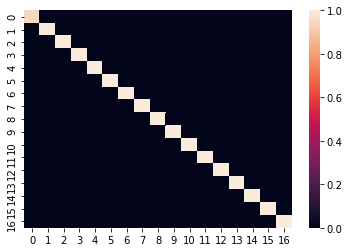

In [44]:
confusion_mat = sklearn.metrics.confusion_matrix(
    y_true=multiclass_labels, y_pred=preds)
print(confusion_mat)
import seaborn as sns
sns.heatmap(confusion_mat/np.sum(confusion_mat, axis=-1)[:,None])
plt.show()

In [45]:
preds_proba.shape

(319575, 17)

-------------------------------------------------------
PATTERNIDX 0 numseqlets 4000


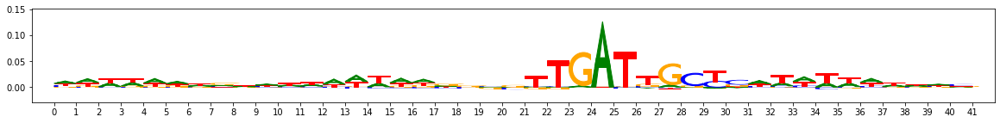

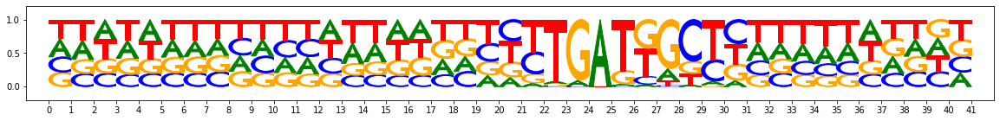

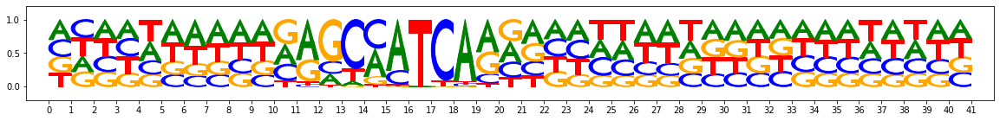

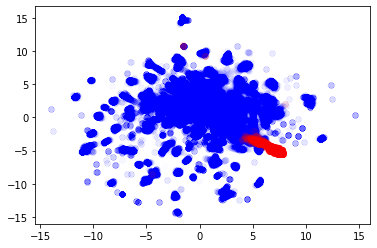

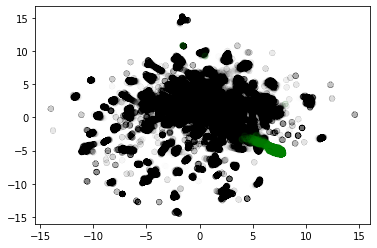

Chosen threshold: 0.9977328141078724 Precision: 0.9000577700751011 Recall: 0.7764764515325193


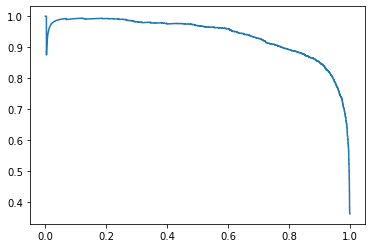

AuPRC: 0.9373078726198999
Reconstructed motif using threshold - numseqlets 3454


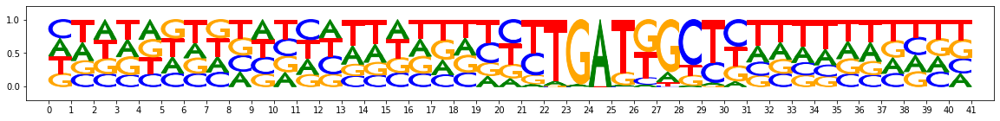

Reconstructed motif using argmax - numseqlets 6822


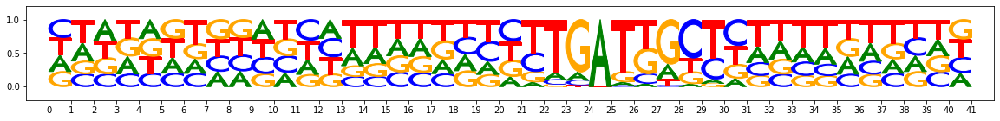

Sample false positive seqlets (argmax preds):
index 126 example:7822,start:472,end:513,rc:False
preds_proba [0.002 0.998 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


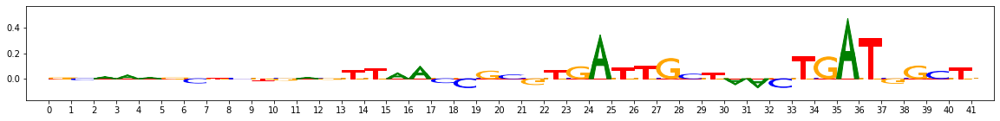

index 51744 example:6780,start:486,end:527,rc:True
preds_proba [0.234 0.762 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.003 0.    0.   ]


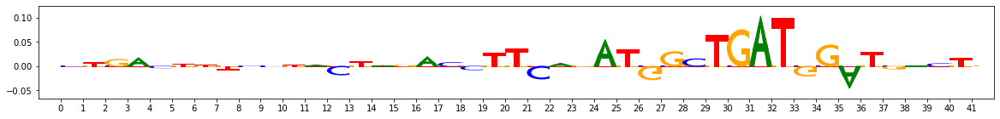

index 130972 example:14929,start:525,end:566,rc:True
preds_proba [0.225 0.744 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.03  0.    0.   ]


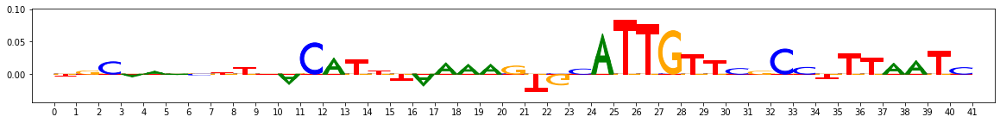

index 252091 example:23164,start:478,end:519,rc:False
preds_proba [0.337 0.637 0.    0.    0.    0.    0.002 0.    0.021 0.    0.    0.
 0.    0.    0.002 0.    0.   ]


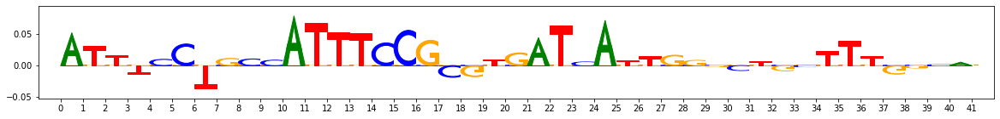

index 274684 example:1625,start:474,end:515,rc:False
preds_proba [0.001 0.999 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


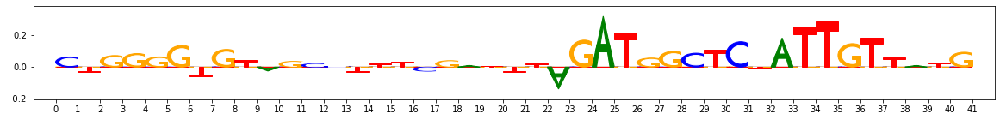

index 319131 example:10986,start:407,end:448,rc:True
preds_proba [0.374 0.609 0.    0.001 0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.011 0.001 0.001]


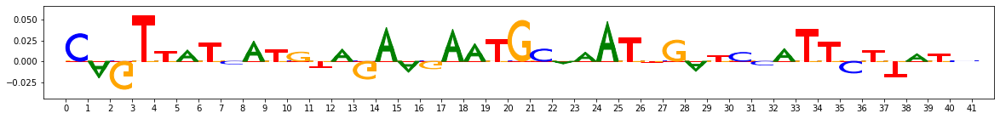

Sample false negative seqlets (argmax preds):
index 987 example:20,start:404,end:445,rc:True
preds_proba [0.678 0.232 0.    0.    0.    0.    0.    0.    0.001 0.    0.001 0.
 0.    0.    0.085 0.001 0.   ]


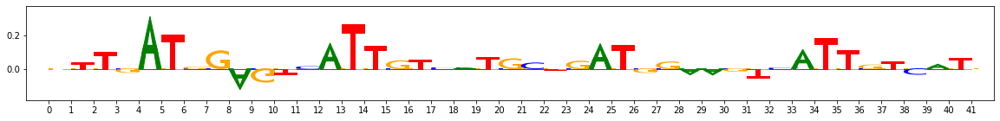

index 29312 example:1083,start:489,end:530,rc:True
preds_proba [0.506 0.488 0.    0.    0.    0.    0.    0.003 0.    0.    0.    0.
 0.    0.    0.001 0.002 0.   ]


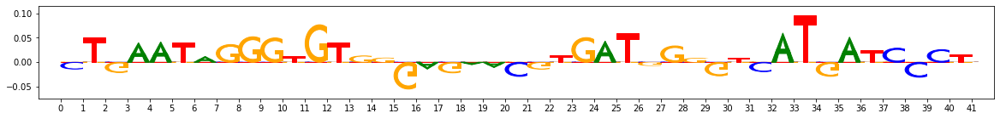

index 35712 example:107,start:439,end:480,rc:True
preds_proba [0.525 0.473 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.001 0.    0.   ]


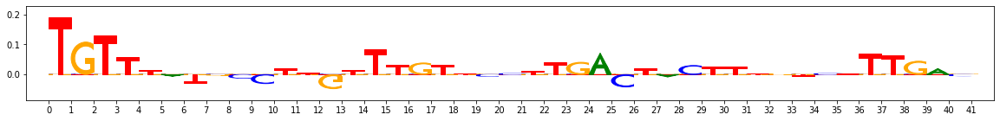

index 48937 example:17965,start:429,end:470,rc:False
preds_proba [0.4   0.383 0.001 0.    0.    0.    0.001 0.003 0.003 0.    0.    0.005
 0.001 0.    0.187 0.    0.014]


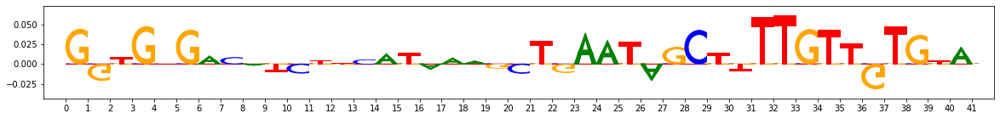

index 58687 example:14290,start:471,end:512,rc:False
preds_proba [0.485 0.473 0.001 0.    0.    0.004 0.    0.    0.    0.    0.    0.
 0.    0.    0.036 0.001 0.   ]


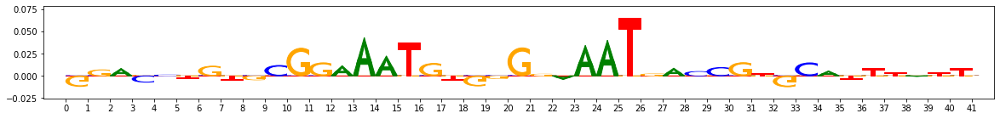

index 83112 example:2725,start:609,end:650,rc:False
preds_proba [0.05  0.09  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.859 0.    0.   ]


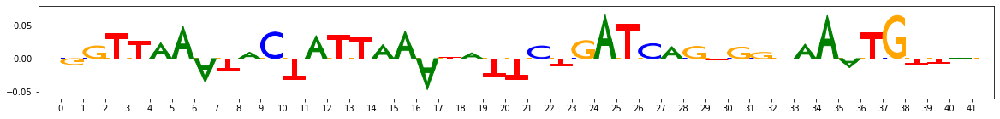

-------------------------------------------------------
PATTERNIDX 1 numseqlets 2193


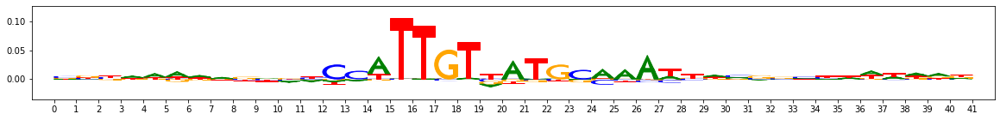

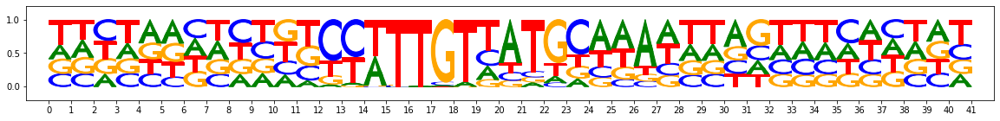

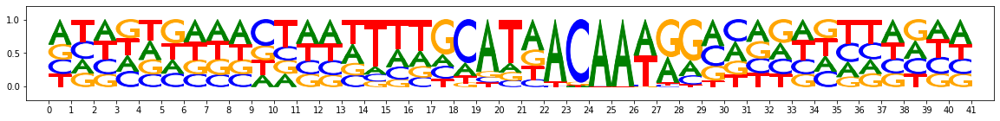

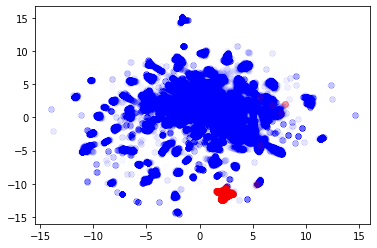

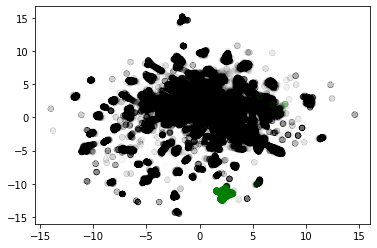

Chosen threshold: 0.9986586738181359 Precision: 0.8351468988030468 Recall: 0.6999544003647971


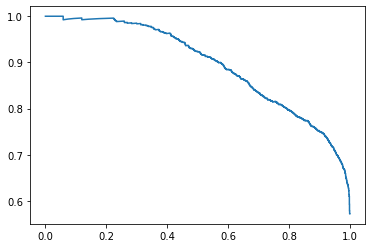

AuPRC: 0.8960033258522758
Reconstructed motif using threshold - numseqlets 1838


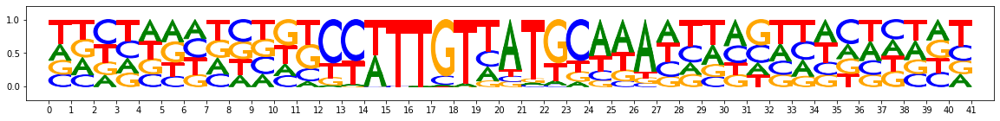

Reconstructed motif using argmax - numseqlets 3707


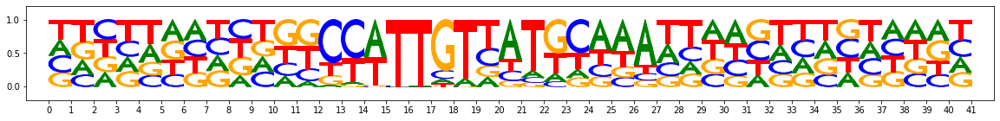

Sample false positive seqlets (argmax preds):
index 661 example:4,start:452,end:493,rc:False
preds_proba [0.356 0.    0.643 0.    0.    0.001 0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


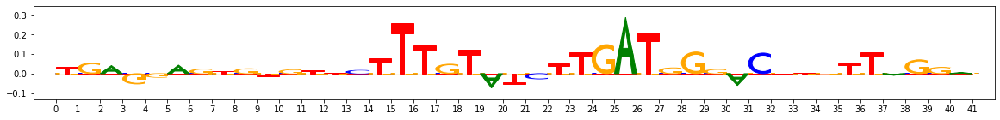

index 99006 example:11024,start:575,end:616,rc:True
preds_proba [0.371 0.    0.627 0.    0.    0.002 0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


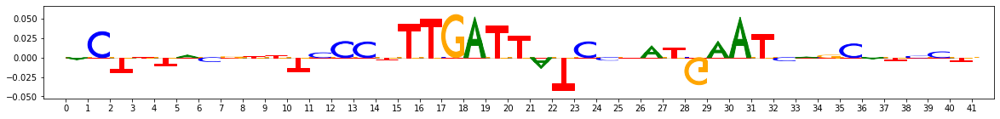

index 284568 example:1278,start:412,end:453,rc:False
preds_proba [0.001 0.    0.999 0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


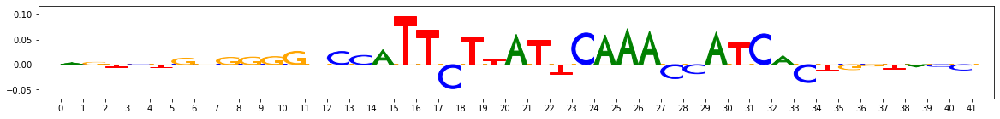

index 292594 example:15947,start:441,end:482,rc:False
preds_proba [0.059 0.    0.921 0.    0.    0.019 0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


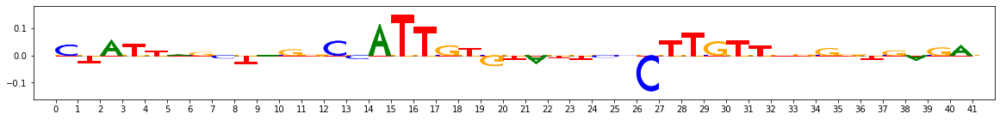

index 303548 example:3744,start:396,end:437,rc:True
preds_proba [0.001 0.    0.999 0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


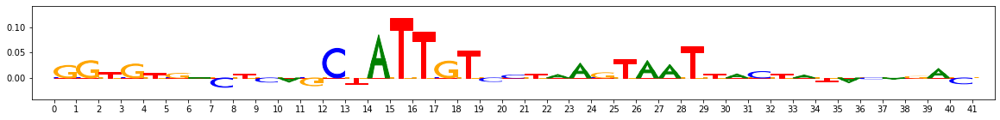

index 319531 example:16369,start:538,end:579,rc:False
preds_proba [0.007 0.    0.992 0.    0.    0.002 0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


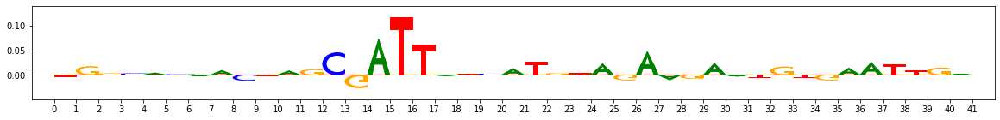

Sample false negative seqlets (argmax preds):
index 110512 example:1262,start:468,end:509,rc:True
preds_proba [0.582 0.    0.356 0.001 0.    0.    0.    0.052 0.    0.    0.    0.
 0.    0.    0.    0.007 0.002]


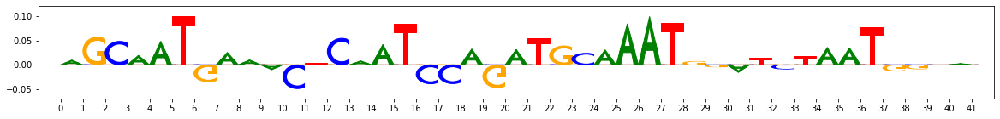

index 124262 example:6523,start:522,end:563,rc:True
preds_proba [0.07  0.062 0.397 0.003 0.    0.029 0.    0.001 0.    0.    0.    0.
 0.    0.    0.432 0.    0.007]


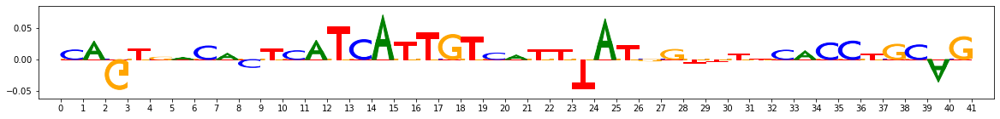

-------------------------------------------------------
PATTERNIDX 2 numseqlets 1817


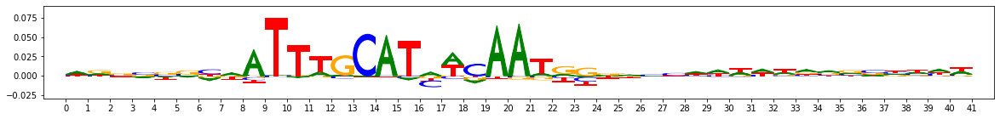

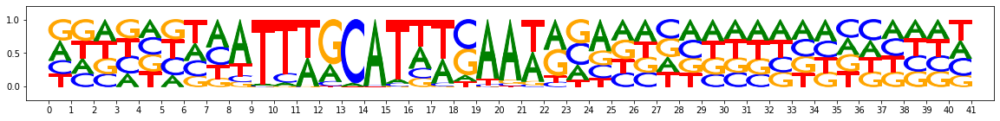

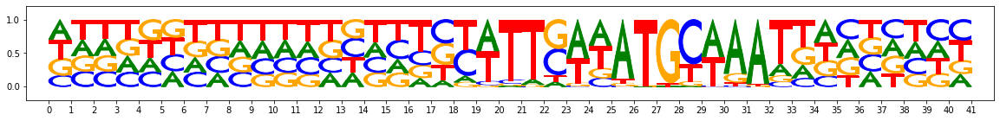

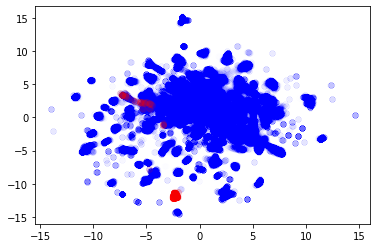

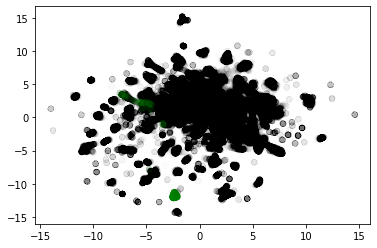

Chosen threshold: 0.9323811004161304 Precision: 0.9001536098310292 Recall: 0.966996699669967


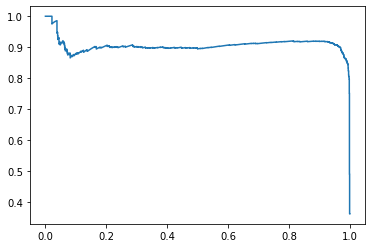

AuPRC: 0.9062029032992259
Reconstructed motif using threshold - numseqlets 1952


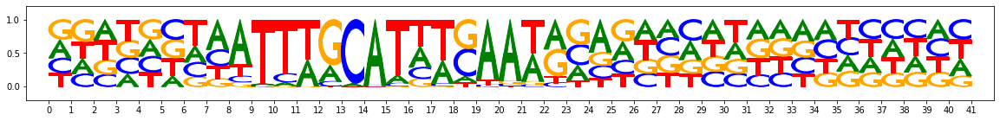

Reconstructed motif using argmax - numseqlets 2302


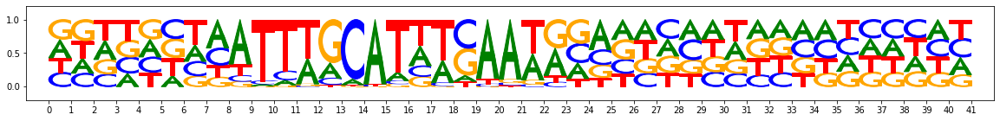

Sample false positive seqlets (argmax preds):
index 117 example:7962,start:491,end:532,rc:True
preds_proba [0.089 0.    0.    0.91  0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


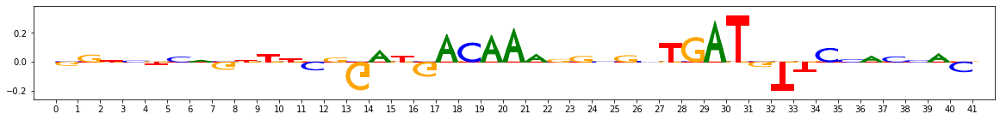

index 165756 example:1796,start:524,end:565,rc:True
preds_proba [0.253 0.    0.    0.743 0.    0.001 0.    0.    0.    0.    0.    0.
 0.001 0.    0.    0.    0.001]


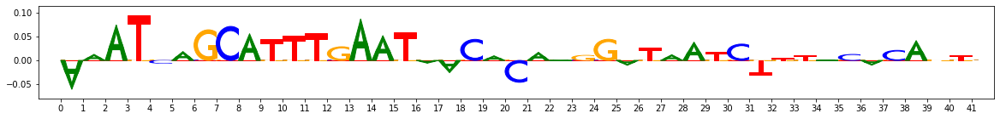

index 257356 example:3836,start:453,end:494,rc:True
preds_proba [0.43  0.    0.001 0.448 0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.119]


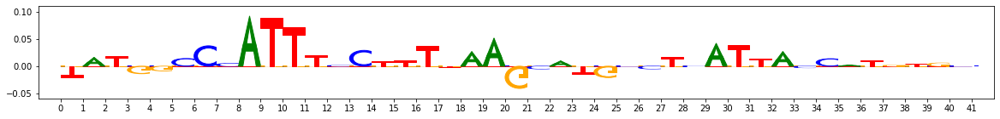

index 298745 example:15169,start:501,end:542,rc:False
preds_proba [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


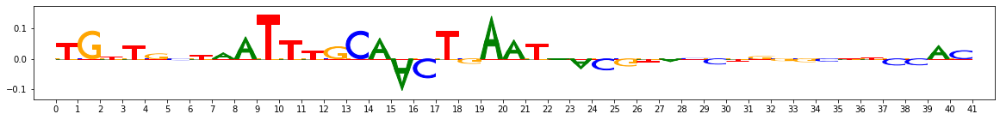

index 311003 example:20915,start:398,end:439,rc:True
preds_proba [0.212 0.    0.    0.785 0.    0.001 0.    0.    0.    0.    0.001 0.
 0.    0.    0.001 0.    0.   ]


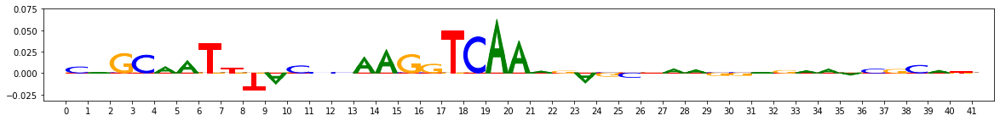

index 318708 example:15503,start:411,end:452,rc:True
preds_proba [0.126 0.    0.001 0.858 0.001 0.    0.    0.001 0.    0.    0.002 0.
 0.    0.    0.006 0.002 0.003]


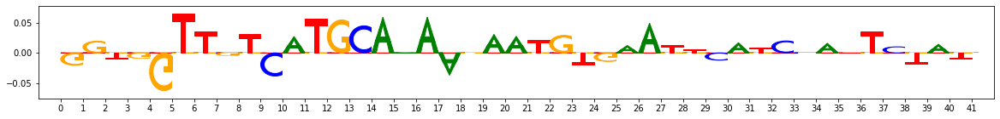

Sample false negative seqlets (argmax preds):
index 156412 example:574,start:458,end:499,rc:True
preds_proba [0.    0.    0.    0.097 0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.903]


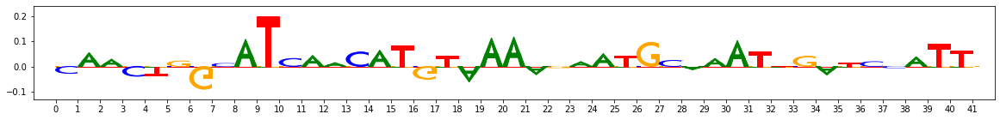

index 168162 example:8888,start:457,end:498,rc:True
preds_proba [0.    0.    0.    0.049 0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.951]


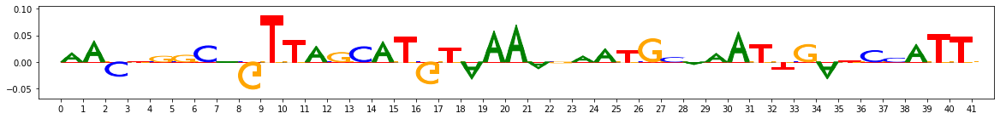

index 186687 example:8014,start:412,end:453,rc:True
preds_proba [0.004 0.    0.    0.35  0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.645]


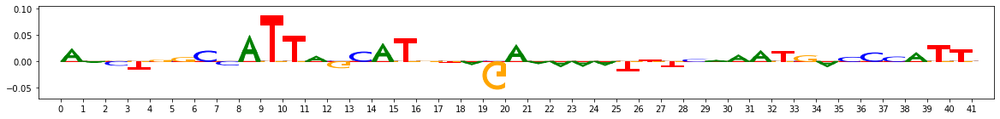

-------------------------------------------------------
PATTERNIDX 3 numseqlets 1618


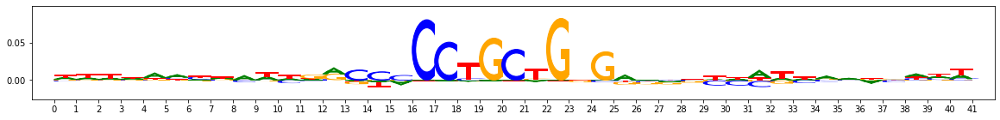

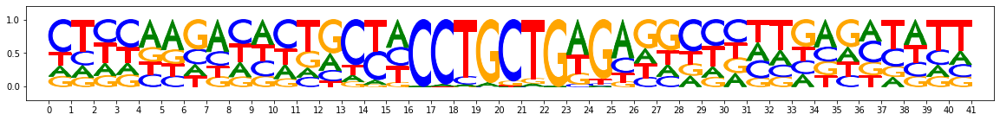

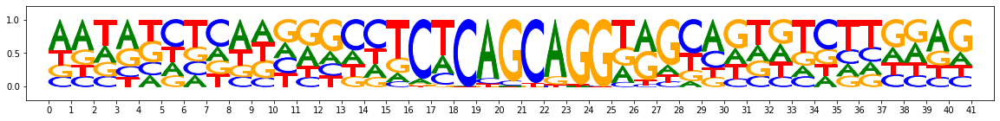

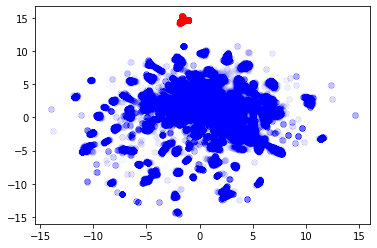

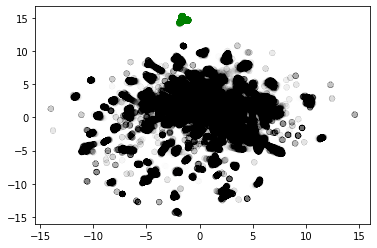

Chosen threshold: 0.8516718165679752 Precision: 0.9694793536804309 Recall: 1.0


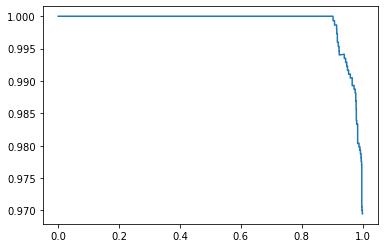

AuPRC: 0.999062088252376
Reconstructed motif using threshold - numseqlets 1665


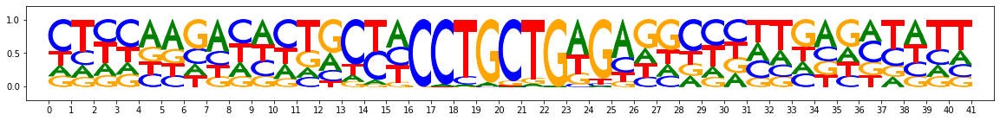

Reconstructed motif using argmax - numseqlets 1738


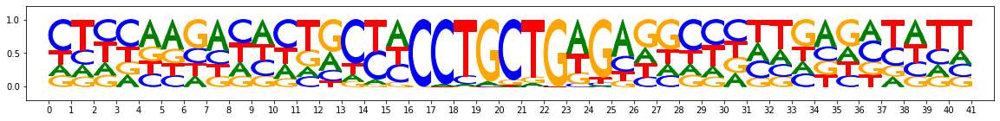

Sample false positive seqlets (argmax preds):
index 6619 example:7617,start:485,end:526,rc:True
preds_proba [0.082 0.    0.    0.    0.917 0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


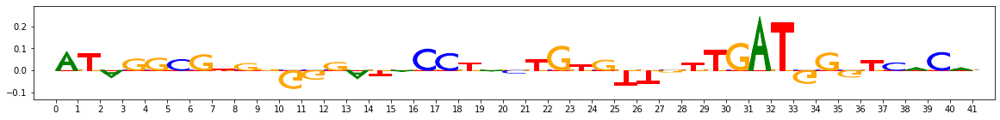

index 87186 example:15702,start:444,end:485,rc:True
preds_proba [0.015 0.    0.001 0.    0.983 0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


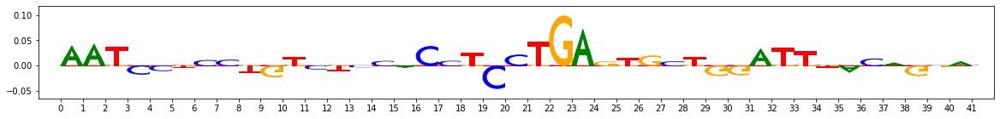

index 200476 example:23322,start:566,end:607,rc:False
preds_proba [0.01  0.    0.    0.    0.988 0.    0.    0.    0.    0.    0.001 0.
 0.001 0.    0.    0.    0.   ]


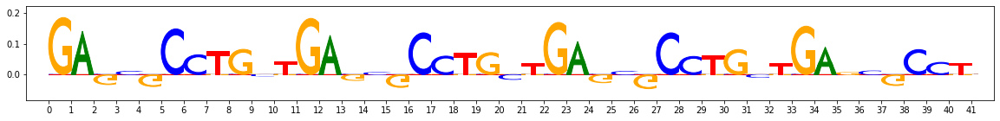

index 231135 example:2411,start:564,end:605,rc:False
preds_proba [0.497 0.    0.    0.    0.5   0.    0.    0.    0.    0.    0.001 0.
 0.    0.    0.    0.    0.   ]


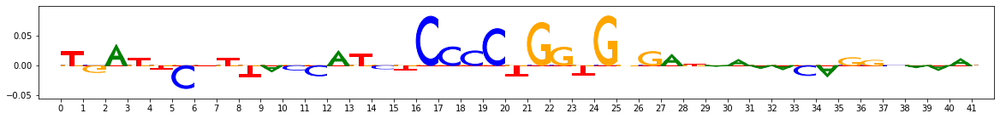

index 248639 example:20066,start:497,end:538,rc:False
preds_proba [0.199 0.    0.014 0.    0.783 0.    0.    0.    0.    0.    0.001 0.003
 0.    0.    0.    0.    0.001]


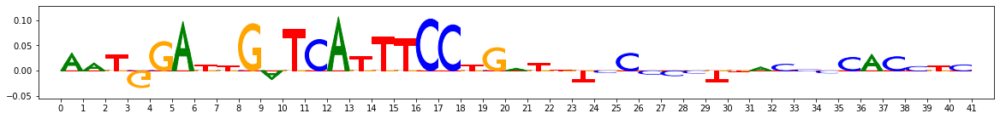

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 4 numseqlets 934


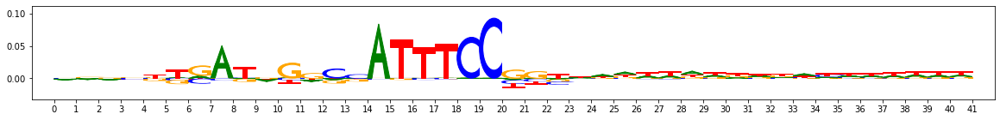

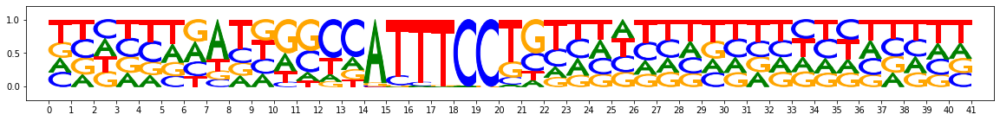

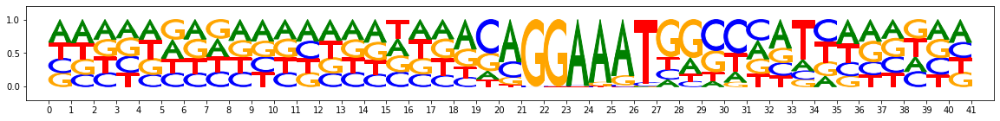

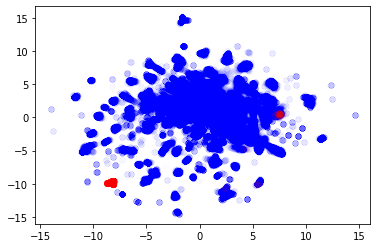

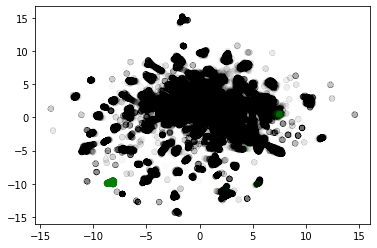

Chosen threshold: 0.8838083315828049 Precision: 0.9001937984496124 Recall: 0.9946466809421841


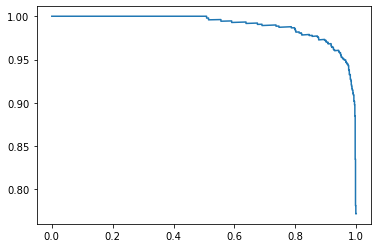

AuPRC: 0.9898110836735823
Reconstructed motif using threshold - numseqlets 1032


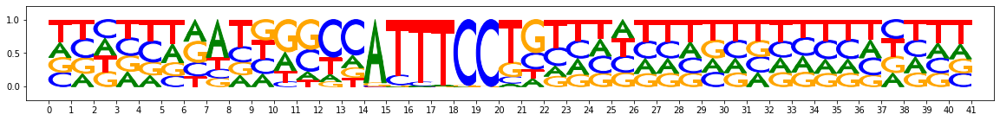

Reconstructed motif using argmax - numseqlets 1379


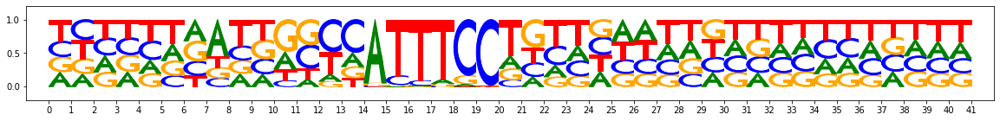

Sample false positive seqlets (argmax preds):
index 972 example:22256,start:490,end:531,rc:False
preds_proba [0.385 0.024 0.013 0.    0.    0.534 0.    0.    0.    0.    0.    0.
 0.    0.    0.043 0.    0.   ]


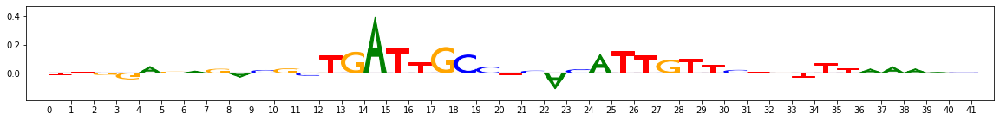

index 152973 example:2401,start:350,end:391,rc:False
preds_proba [0.418 0.    0.    0.    0.    0.574 0.    0.    0.    0.    0.006 0.
 0.    0.    0.001 0.    0.   ]


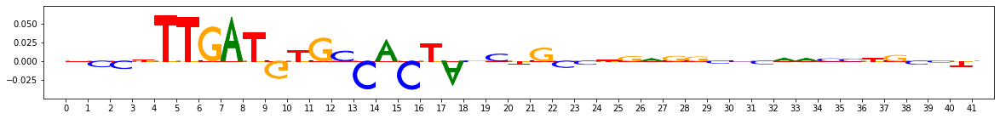

index 177793 example:7170,start:504,end:545,rc:True
preds_proba [0.256 0.    0.146 0.005 0.    0.591 0.    0.001 0.    0.    0.    0.
 0.    0.    0.001 0.001 0.   ]


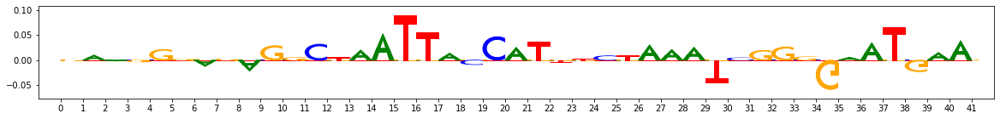

index 193106 example:10682,start:532,end:573,rc:False
preds_proba [0.22  0.    0.011 0.001 0.    0.766 0.    0.001 0.    0.    0.    0.
 0.    0.    0.002 0.    0.   ]


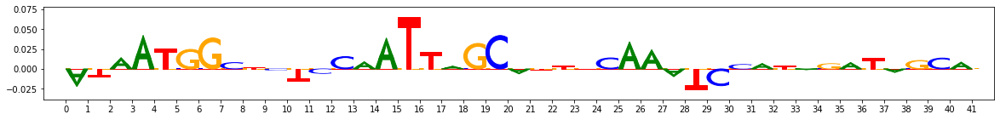

index 236410 example:15501,start:554,end:595,rc:False
preds_proba [0.003 0.    0.    0.    0.    0.997 0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


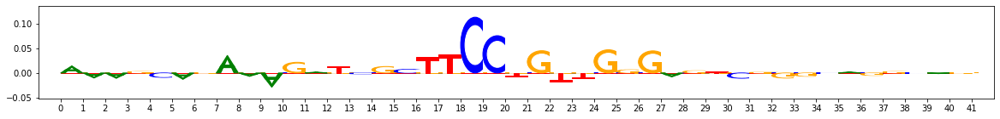

index 317851 example:2199,start:502,end:543,rc:False
preds_proba [0.078 0.    0.002 0.002 0.    0.895 0.    0.014 0.    0.    0.    0.
 0.    0.    0.01  0.    0.   ]


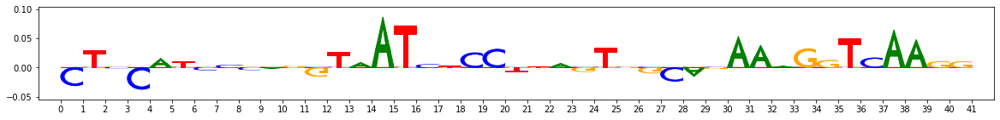

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 5 numseqlets 645


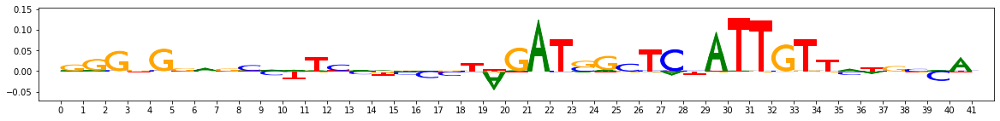

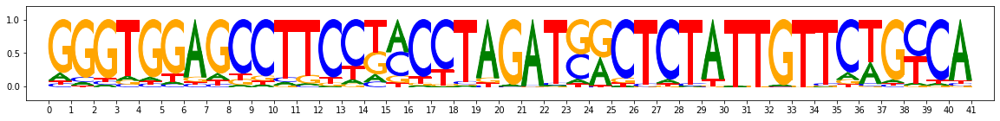

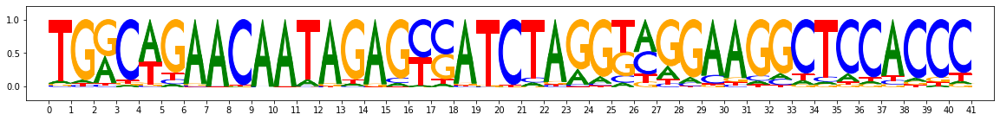

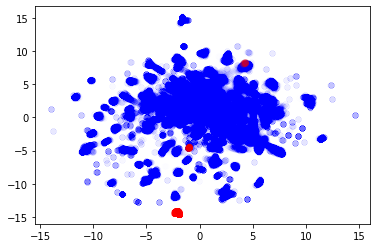

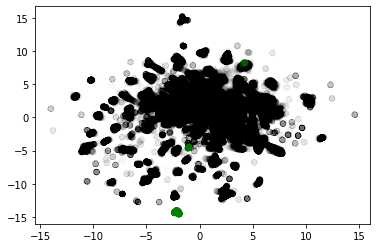

Chosen threshold: 0.8827666564945511 Precision: 0.9253945480631277 Recall: 1.0


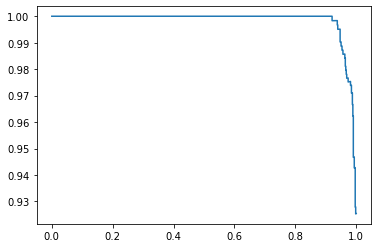

AuPRC: 0.9984645151399936
Reconstructed motif using threshold - numseqlets 697


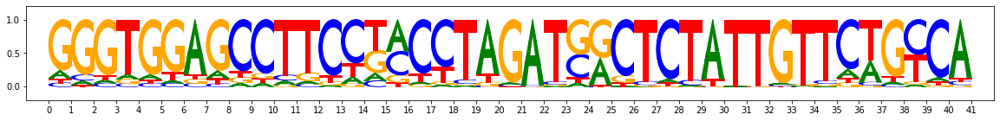

Reconstructed motif using argmax - numseqlets 1025


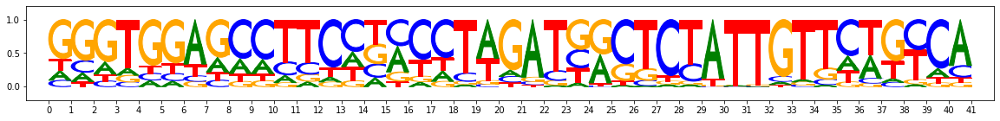

Sample false positive seqlets (argmax preds):
index 159 example:1806,start:459,end:500,rc:True
preds_proba [0.247 0.    0.    0.    0.    0.    0.739 0.    0.013 0.    0.    0.
 0.    0.001 0.    0.    0.   ]


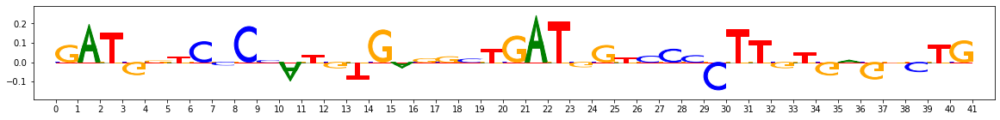

index 43965 example:5434,start:431,end:472,rc:False
preds_proba [0.338 0.001 0.    0.    0.    0.    0.655 0.    0.003 0.    0.    0.
 0.    0.002 0.    0.    0.   ]


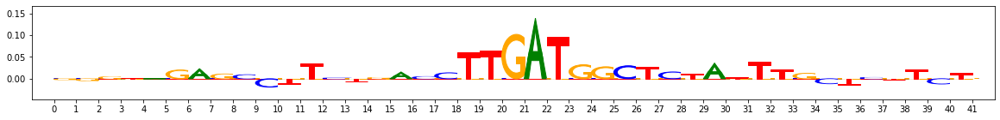

index 163092 example:8789,start:433,end:474,rc:False
preds_proba [0.44  0.    0.001 0.006 0.001 0.021 0.457 0.    0.001 0.001 0.004 0.
 0.004 0.007 0.056 0.002 0.001]


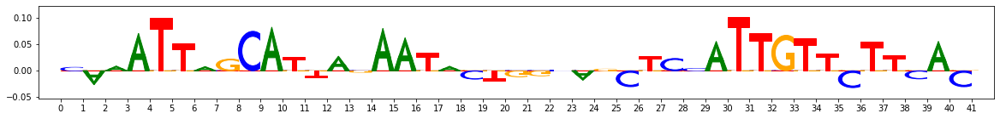

index 291604 example:239,start:485,end:526,rc:False
preds_proba [0.355 0.    0.    0.    0.    0.    0.642 0.    0.    0.    0.    0.
 0.    0.001 0.    0.    0.   ]


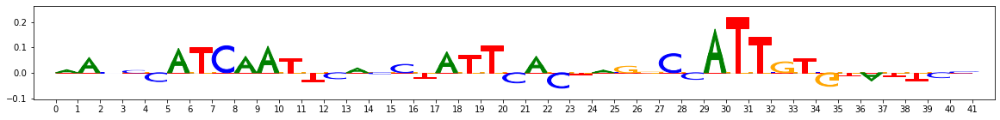

index 294879 example:1248,start:408,end:449,rc:False
preds_proba [0.218 0.    0.    0.    0.    0.    0.781 0.    0.    0.    0.    0.
 0.001 0.    0.    0.    0.   ]


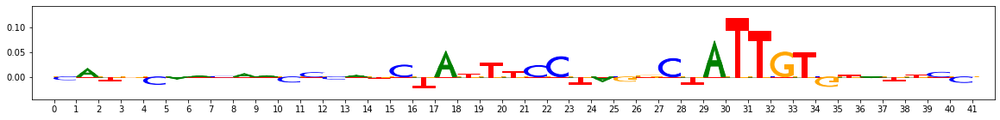

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 6 numseqlets 457


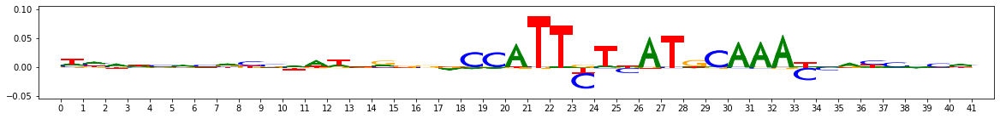

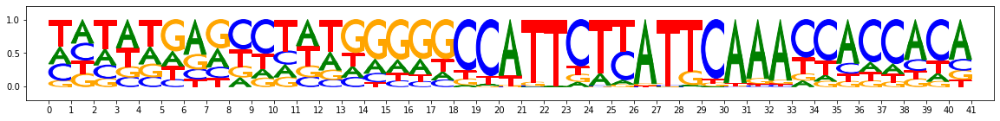

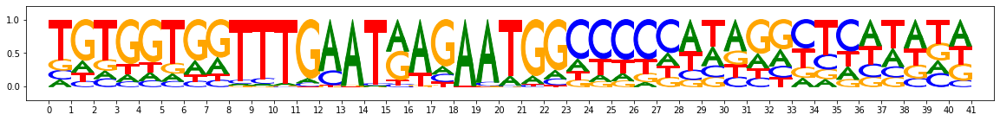

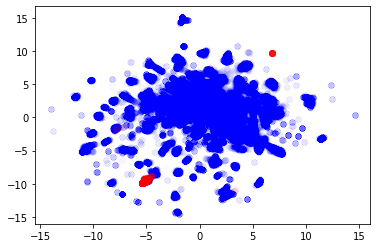

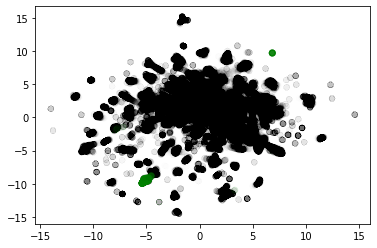

Chosen threshold: 0.99710337424445 Precision: 0.7299771167048055 Recall: 0.6980306345733042


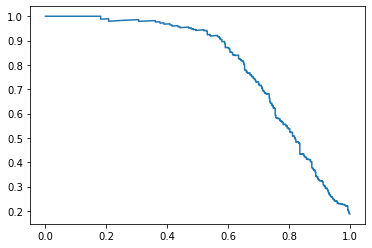

AuPRC: 0.7948762570240143
Reconstructed motif using threshold - numseqlets 437


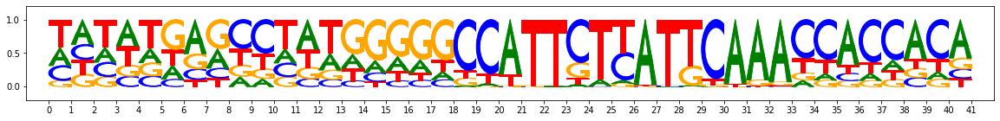

Reconstructed motif using argmax - numseqlets 2642


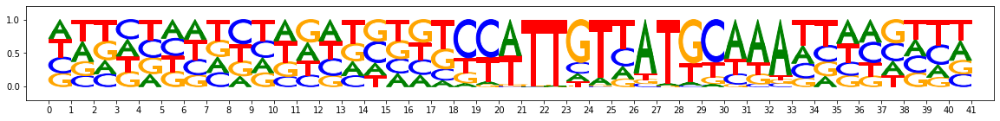

Sample false positive seqlets (argmax preds):
index 1820 example:20,start:516,end:557,rc:True
preds_proba [0.316 0.002 0.    0.    0.    0.    0.    0.681 0.    0.    0.    0.
 0.    0.    0.    0.    0.001]


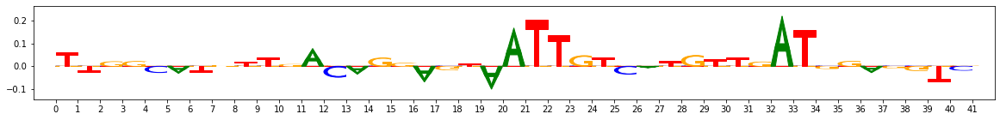

index 112206 example:2183,start:469,end:510,rc:False
preds_proba [0.009 0.    0.    0.    0.    0.    0.    0.991 0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


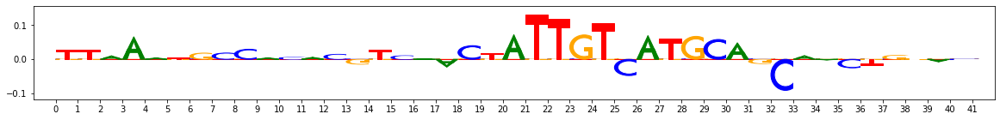

index 127593 example:23307,start:461,end:502,rc:True
preds_proba [0.002 0.    0.    0.    0.    0.    0.    0.998 0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


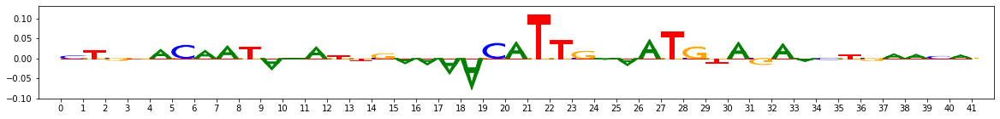

index 145718 example:7025,start:505,end:546,rc:True
preds_proba [0.047 0.    0.    0.    0.    0.    0.    0.951 0.    0.    0.    0.
 0.    0.    0.    0.001 0.   ]


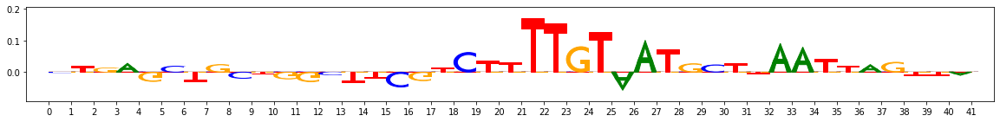

index 194974 example:16857,start:547,end:588,rc:True
preds_proba [0.479 0.    0.    0.    0.    0.    0.    0.521 0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


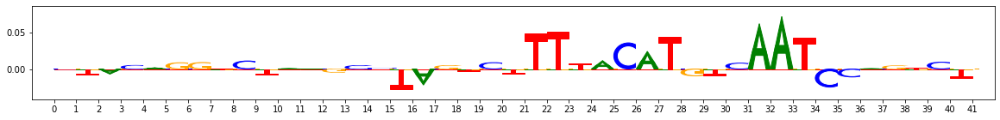

index 319574 example:1924,start:505,end:546,rc:True
preds_proba [0.001 0.    0.    0.    0.    0.    0.    0.999 0.    0.    0.    0.
 0.    0.    0.    0.    0.   ]


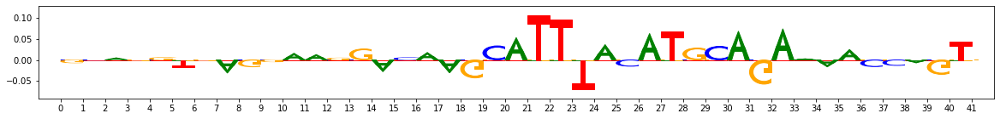

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 7 numseqlets 227


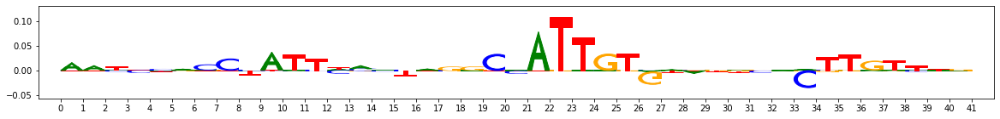

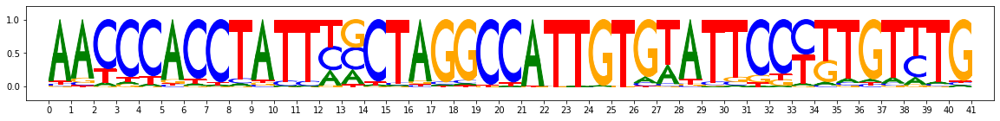

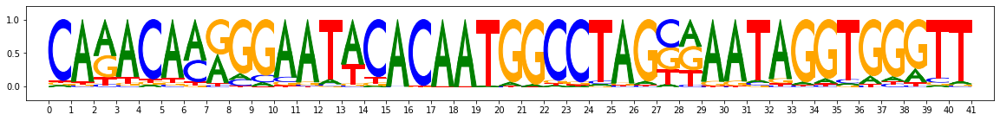

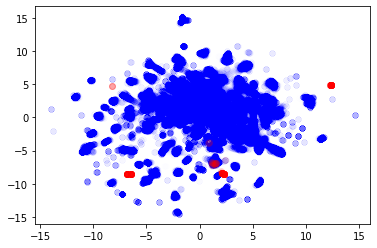

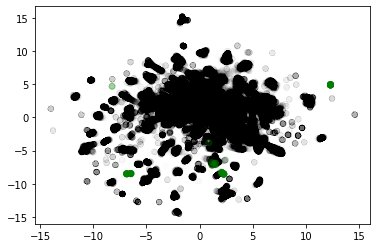

Chosen threshold: 0.9738126294379902 Precision: 0.902127659574468 Recall: 0.933920704845815


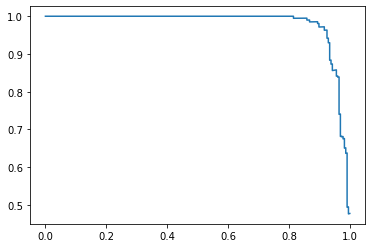

AuPRC: 0.9804152212999492
Reconstructed motif using threshold - numseqlets 235


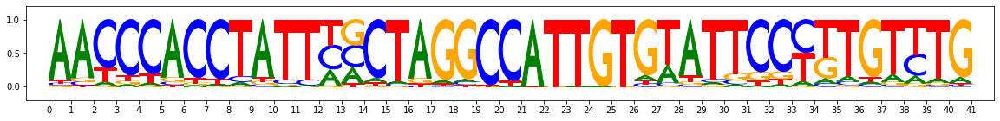

Reconstructed motif using argmax - numseqlets 1228


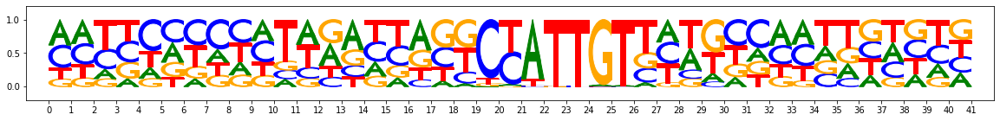

Sample false positive seqlets (argmax preds):
index 1821 example:20,start:517,end:558,rc:True
preds_proba [0.291 0.    0.    0.    0.    0.    0.004 0.    0.705 0.    0.    0.
 0.    0.    0.    0.    0.   ]


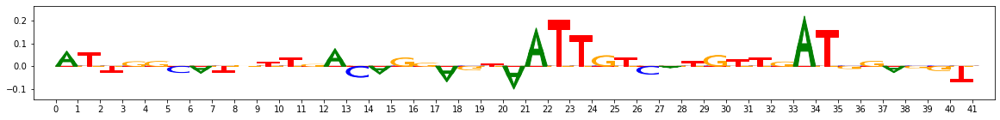

index 114605 example:13964,start:552,end:593,rc:False
preds_proba [0.38  0.    0.    0.    0.    0.    0.    0.    0.619 0.    0.    0.
 0.    0.    0.    0.    0.   ]


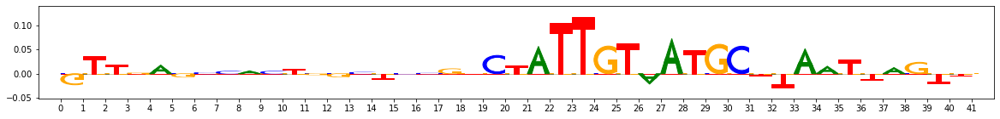

index 128769 example:11164,start:519,end:560,rc:True
preds_proba [0.108 0.    0.    0.    0.    0.    0.    0.    0.892 0.    0.    0.
 0.    0.    0.    0.    0.   ]


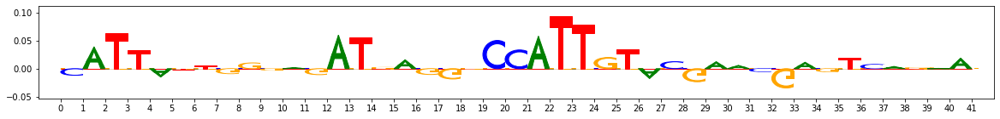

index 143269 example:7397,start:416,end:457,rc:True
preds_proba [0.084 0.    0.    0.    0.    0.    0.    0.    0.916 0.    0.    0.
 0.    0.    0.    0.    0.   ]


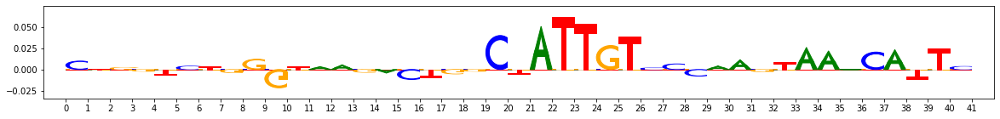

index 270204 example:6632,start:495,end:536,rc:True
preds_proba [0.368 0.    0.    0.    0.    0.    0.    0.    0.632 0.    0.    0.
 0.    0.    0.    0.    0.   ]


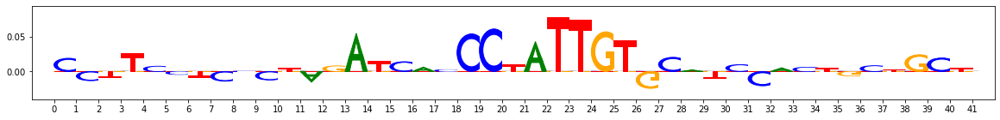

index 294925 example:7430,start:435,end:476,rc:True
preds_proba [0.444 0.001 0.    0.    0.    0.    0.    0.    0.554 0.    0.    0.
 0.    0.    0.    0.    0.   ]


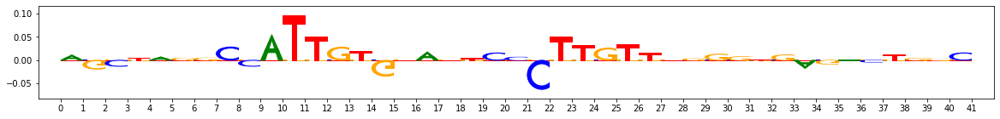

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 8 numseqlets 135


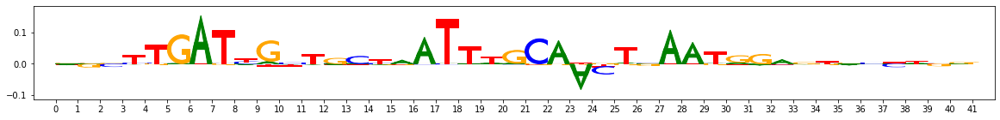

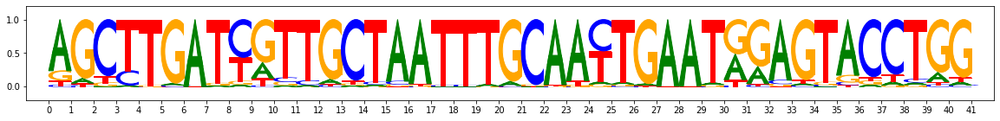

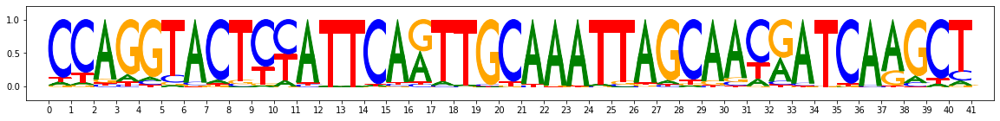

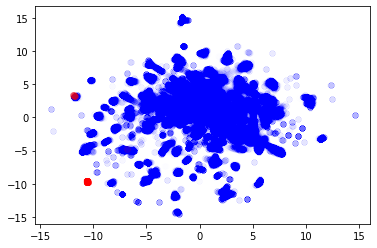

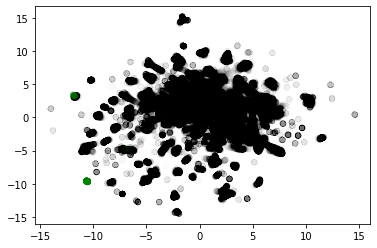

Chosen threshold: 0.9903178504393971 Precision: 0.9 Recall: 0.9333333333333333


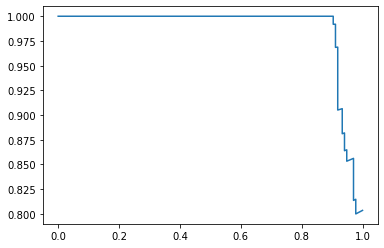

AuPRC: 0.9874631846740797
Reconstructed motif using threshold - numseqlets 140


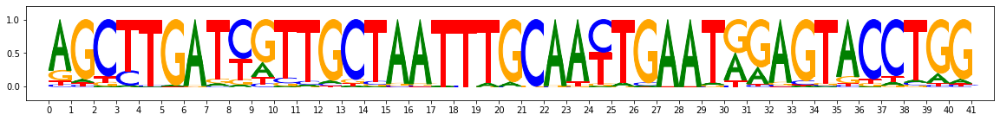

Reconstructed motif using argmax - numseqlets 420


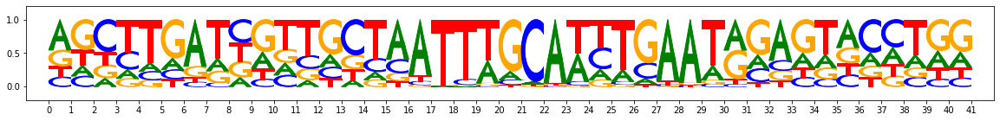

Sample false positive seqlets (argmax preds):
index 1045 example:15361,start:485,end:526,rc:False
preds_proba [0.105 0.    0.    0.    0.    0.    0.    0.    0.    0.886 0.006 0.001
 0.    0.001 0.    0.    0.   ]


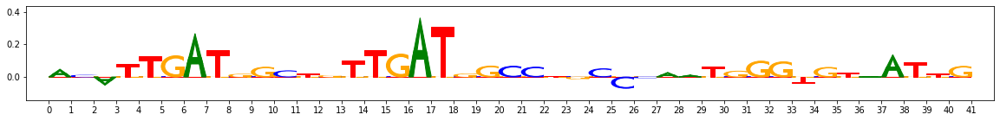

index 158170 example:12653,start:520,end:561,rc:True
preds_proba [0.1 0.  0.  0.  0.  0.  0.  0.  0.  0.9 0.  0.  0.  0.  0.  0.  0. ]


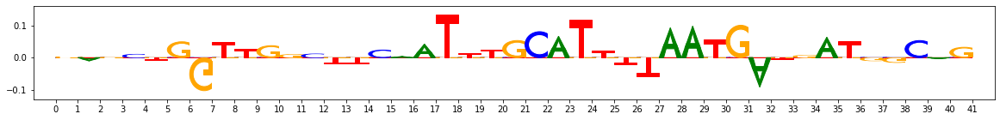

index 165904 example:15338,start:424,end:465,rc:False
preds_proba [0.373 0.    0.    0.    0.    0.    0.    0.    0.    0.621 0.002 0.
 0.003 0.001 0.    0.    0.   ]


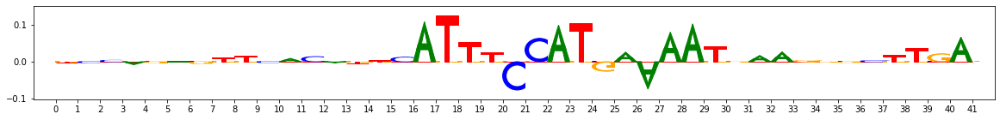

index 175595 example:11873,start:439,end:480,rc:True
preds_proba [0.024 0.    0.    0.    0.    0.    0.    0.    0.    0.975 0.001 0.
 0.    0.    0.    0.    0.   ]


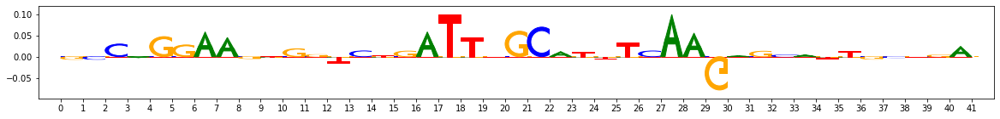

index 186945 example:15256,start:499,end:540,rc:True
preds_proba [0.203 0.    0.    0.    0.    0.    0.    0.    0.    0.795 0.001 0.
 0.    0.    0.    0.    0.   ]


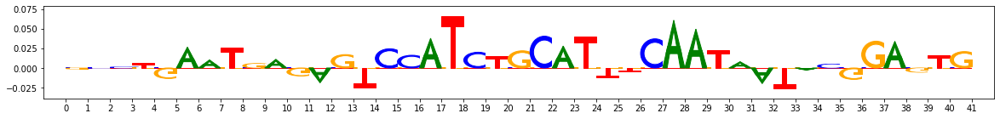

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 9 numseqlets 170


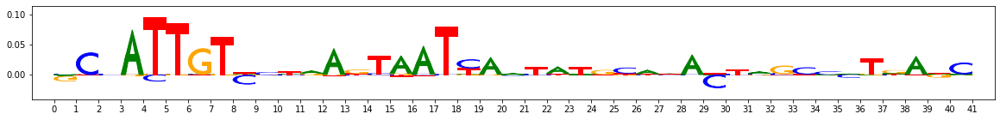

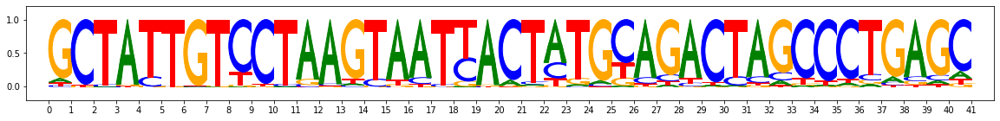

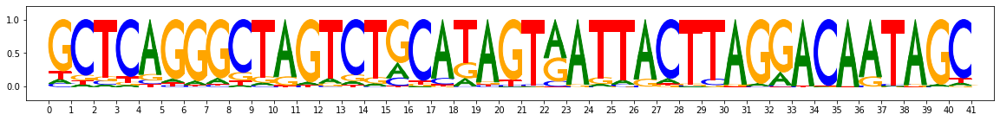

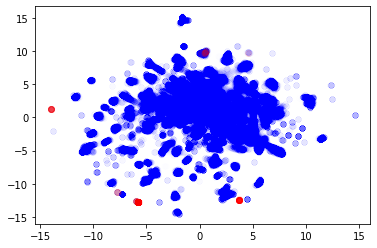

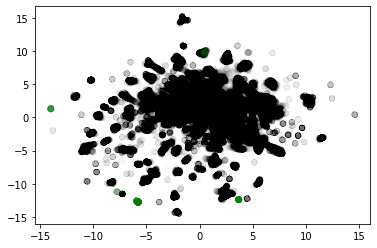

Chosen threshold: 0.9996031700236341 Precision: 0.9027777777777778 Recall: 0.7647058823529411


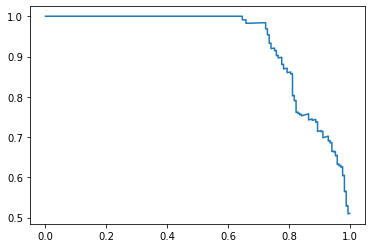

AuPRC: 0.9331168230751105
Reconstructed motif using threshold - numseqlets 144


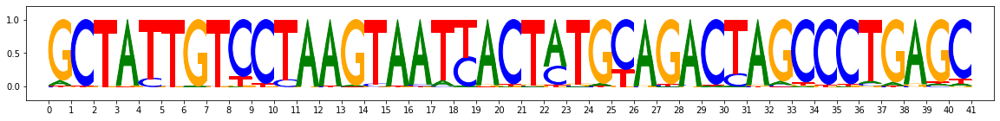

Reconstructed motif using argmax - numseqlets 748


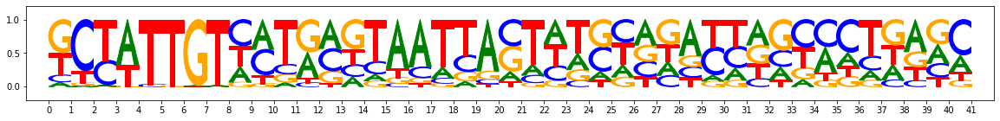

Sample false positive seqlets (argmax preds):
index 390 example:14467,start:491,end:532,rc:True
preds_proba [0.461 0.    0.    0.    0.    0.    0.    0.    0.    0.019 0.501 0.
 0.    0.001 0.001 0.017 0.   ]


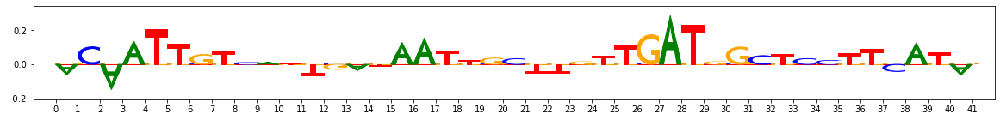

index 112048 example:11181,start:537,end:578,rc:False
preds_proba [0.164 0.    0.    0.    0.    0.    0.    0.    0.    0.001 0.834 0.
 0.    0.001 0.    0.    0.   ]


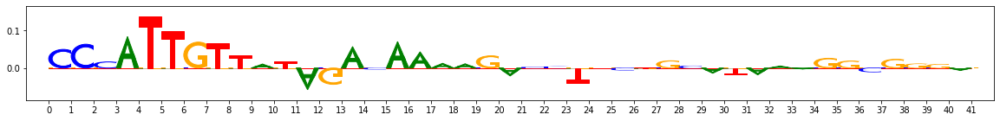

index 126598 example:20859,start:502,end:543,rc:False
preds_proba [0.365 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.633 0.
 0.    0.001 0.    0.    0.   ]


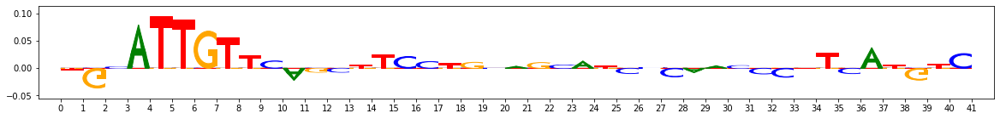

index 140323 example:18746,start:436,end:477,rc:False
preds_proba [0.105 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.894 0.
 0.    0.    0.    0.    0.   ]


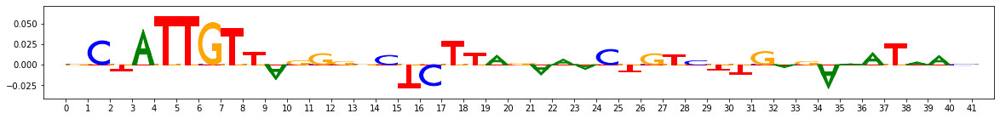

index 148101 example:2930,start:373,end:414,rc:True
preds_proba [0.458 0.    0.    0.    0.    0.    0.    0.    0.    0.001 0.539 0.
 0.    0.    0.    0.    0.   ]


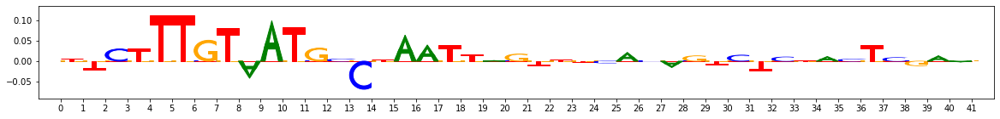

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 10 numseqlets 132


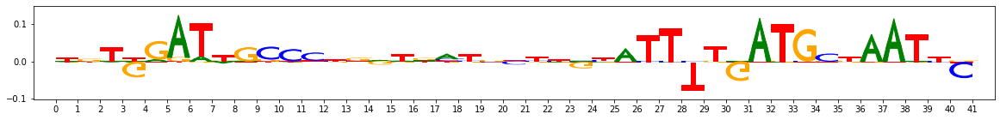

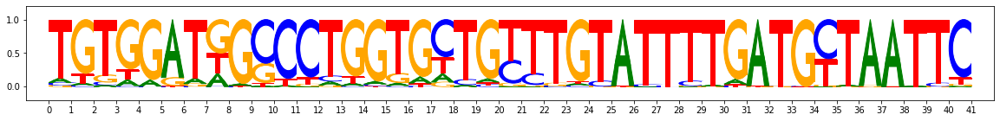

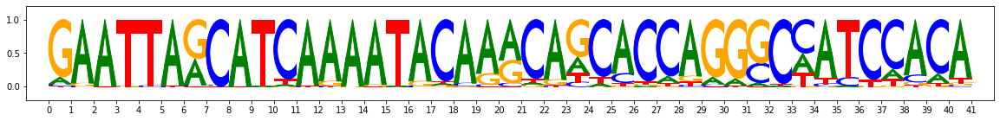

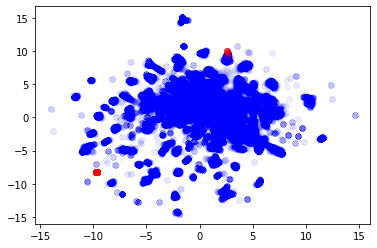

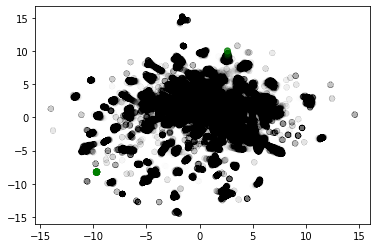

Chosen threshold: 0.9474475154919972 Precision: 0.903448275862069 Recall: 0.9924242424242424


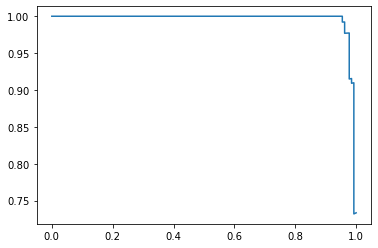

AuPRC: 0.996250818009212
Reconstructed motif using threshold - numseqlets 145


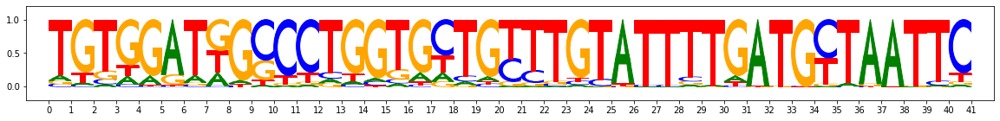

Reconstructed motif using argmax - numseqlets 590


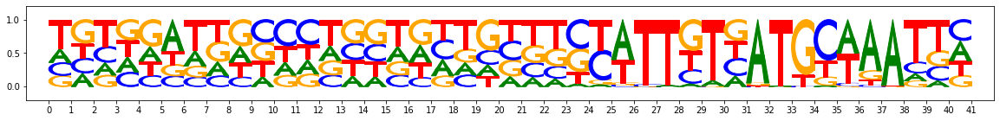

Sample false positive seqlets (argmax preds):
index 15671 example:4577,start:496,end:537,rc:False
preds_proba [0.438 0.002 0.005 0.    0.    0.    0.    0.003 0.001 0.    0.    0.502
 0.    0.    0.042 0.004 0.   ]


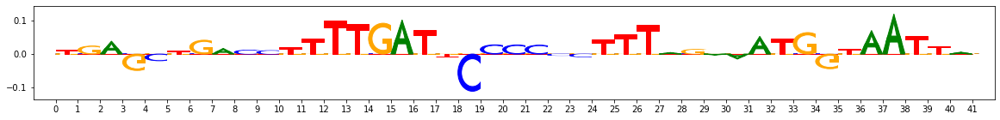

index 108423 example:11536,start:512,end:553,rc:True
preds_proba [0.462 0.    0.002 0.001 0.    0.    0.    0.003 0.    0.    0.    0.526
 0.    0.    0.003 0.    0.   ]


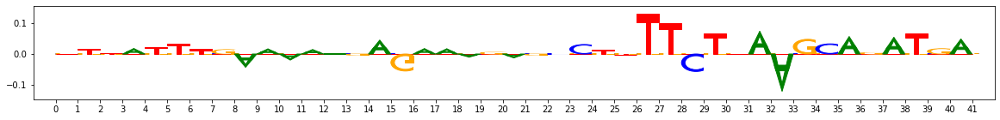

index 121446 example:1683,start:568,end:609,rc:False
preds_proba [0.142 0.    0.    0.001 0.    0.    0.    0.    0.    0.001 0.001 0.853
 0.    0.    0.    0.    0.   ]


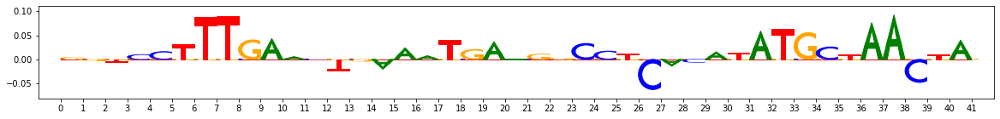

index 139823 example:8964,start:465,end:506,rc:True
preds_proba [0.164 0.    0.    0.    0.    0.    0.    0.008 0.    0.003 0.    0.824
 0.    0.    0.    0.    0.   ]


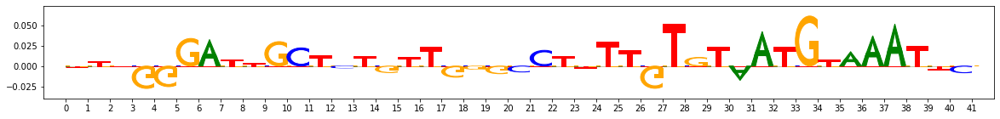

index 282892 example:2122,start:518,end:559,rc:True
preds_proba [0.064 0.    0.001 0.    0.    0.    0.    0.001 0.    0.    0.    0.934
 0.    0.    0.    0.    0.   ]


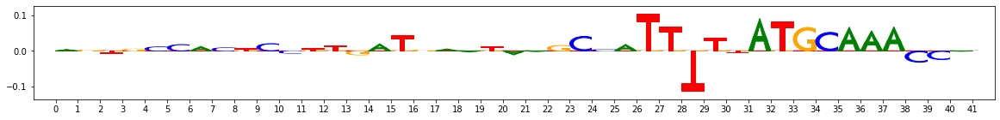

index 291392 example:5522,start:471,end:512,rc:True
preds_proba [0.393 0.    0.    0.    0.    0.    0.    0.001 0.    0.    0.    0.606
 0.    0.    0.    0.    0.   ]


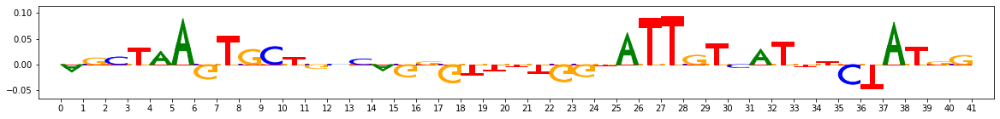

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 11 numseqlets 116


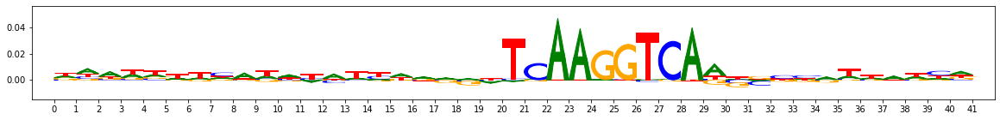

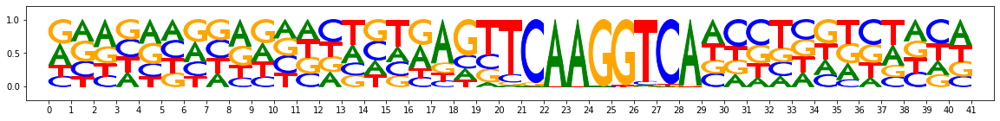

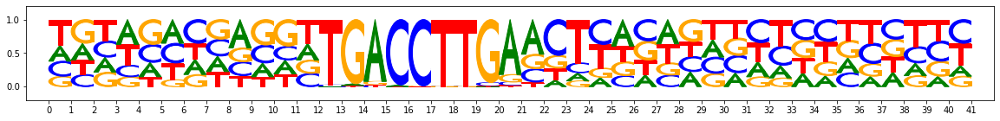

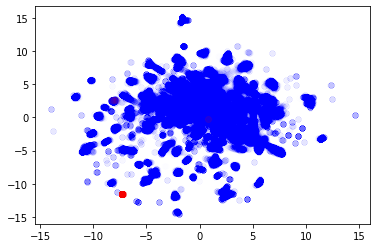

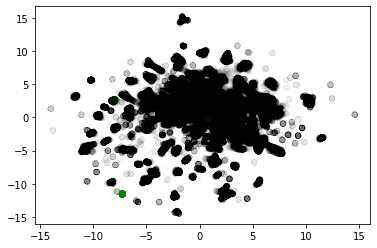

Chosen threshold: 0.9995197755108234 Precision: 0.6639344262295082 Recall: 0.6982758620689655


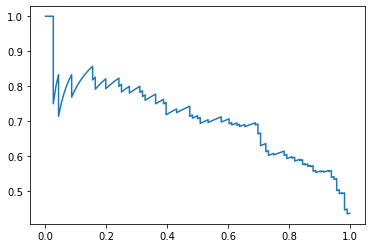

AuPRC: 0.7090848727374418
Reconstructed motif using threshold - numseqlets 122


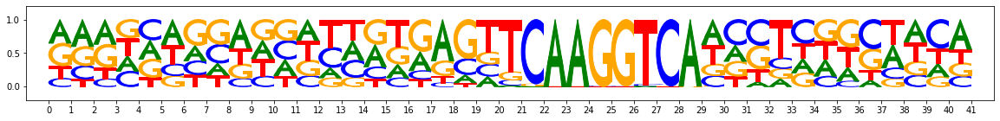

Reconstructed motif using argmax - numseqlets 383


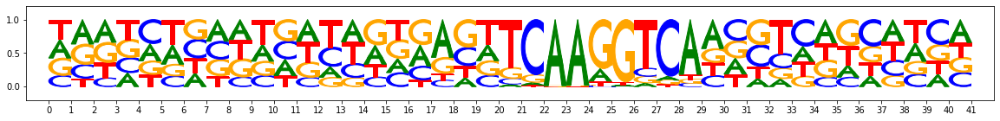

Sample false positive seqlets (argmax preds):
index 7147 example:2992,start:504,end:545,rc:True
preds_proba [0.27  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.606 0.    0.121 0.    0.001]


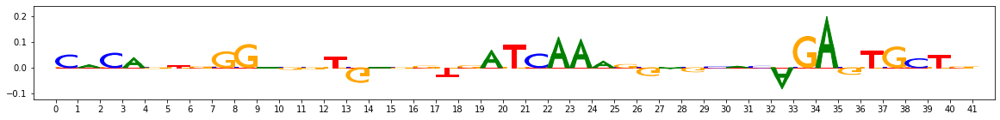

index 162834 example:3755,start:556,end:597,rc:False
preds_proba [0.473 0.    0.    0.    0.001 0.    0.    0.    0.    0.    0.    0.
 0.523 0.    0.    0.    0.001]


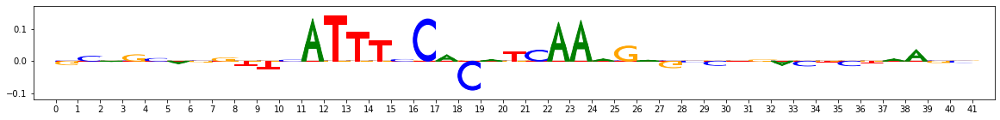

index 308806 example:11928,start:568,end:609,rc:False
preds_proba [0.107 0.    0.    0.    0.    0.    0.001 0.    0.    0.001 0.    0.
 0.89  0.    0.    0.    0.   ]


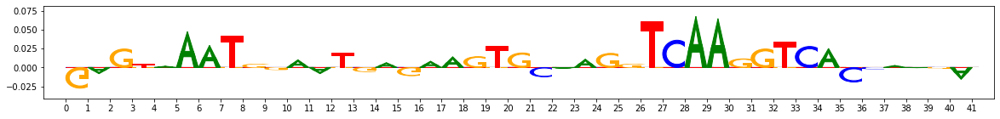

index 316083 example:8215,start:256,end:297,rc:True
preds_proba [0.115 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.884 0.    0.001 0.    0.   ]


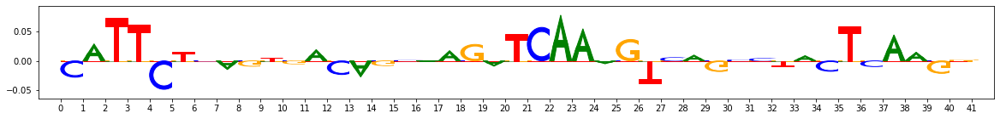

index 317208 example:5556,start:394,end:435,rc:True
preds_proba [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]


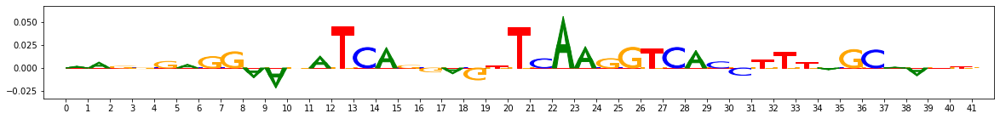

index 318079 example:17849,start:459,end:500,rc:False
preds_proba [0.421 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.579 0.    0.    0.    0.   ]


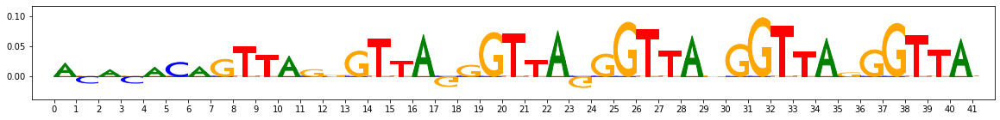

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 12 numseqlets 77


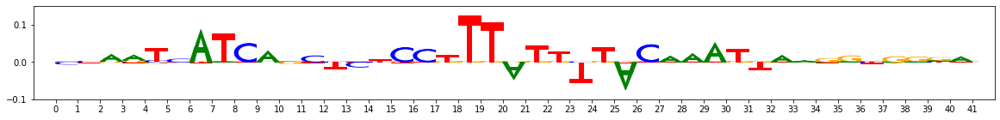

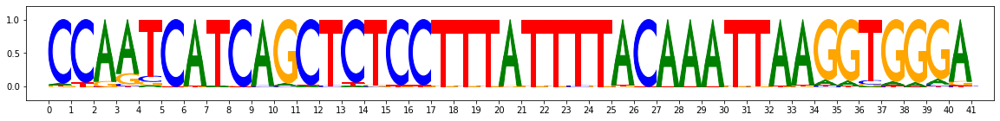

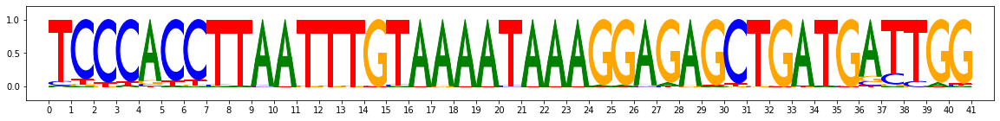

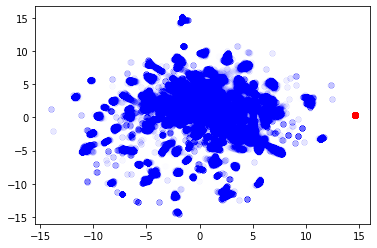

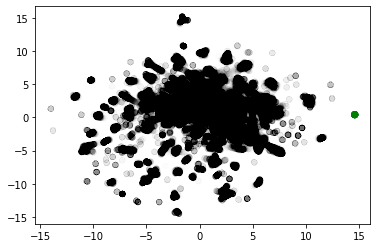

Chosen threshold: 0.985544169703689 Precision: 1.0 Recall: 1.0


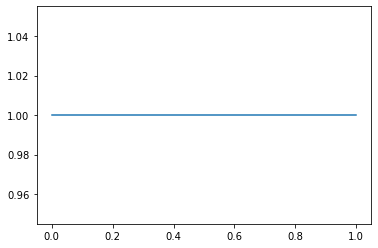

AuPRC: 1.0
Reconstructed motif using threshold - numseqlets 77


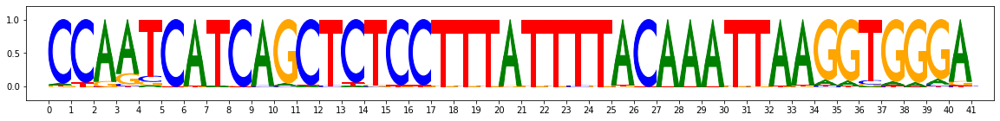

Reconstructed motif using argmax - numseqlets 110


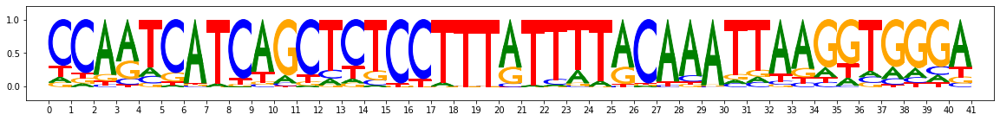

Sample false positive seqlets (argmax preds):
index 4792 example:20213,start:472,end:513,rc:True
preds_proba [0.439 0.    0.    0.    0.    0.    0.002 0.    0.    0.011 0.    0.
 0.    0.546 0.    0.    0.   ]


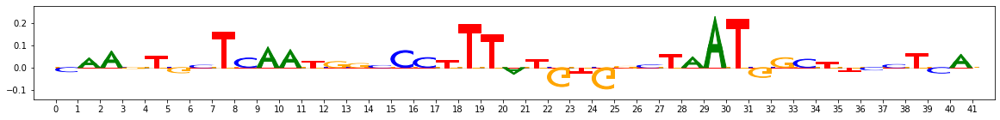

index 102340 example:48,start:338,end:379,rc:True
preds_proba [0.131 0.    0.001 0.    0.    0.    0.    0.    0.    0.003 0.    0.
 0.    0.864 0.    0.    0.   ]


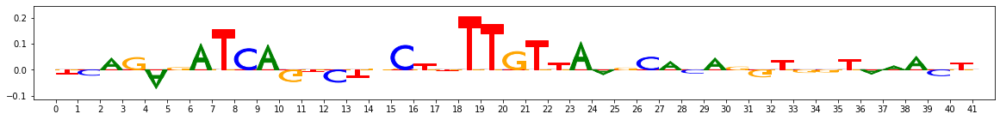

index 108940 example:4416,start:413,end:454,rc:True
preds_proba [0.153 0.    0.001 0.    0.    0.    0.    0.    0.    0.015 0.    0.
 0.    0.829 0.    0.001 0.   ]


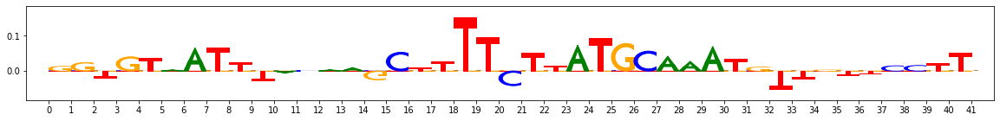

index 112965 example:6788,start:466,end:507,rc:True
preds_proba [0.149 0.    0.003 0.    0.    0.    0.    0.003 0.    0.021 0.    0.001
 0.    0.821 0.    0.    0.002]


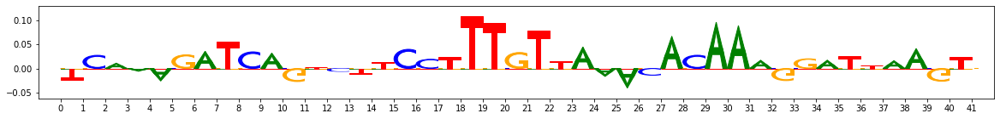

index 122109 example:8545,start:532,end:573,rc:False
preds_proba [0.441 0.    0.001 0.    0.    0.    0.    0.    0.    0.014 0.    0.
 0.    0.543 0.    0.001 0.   ]


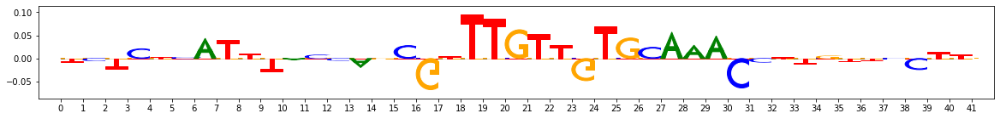

index 152065 example:14641,start:748,end:789,rc:True
preds_proba [0.458 0.    0.001 0.    0.    0.    0.    0.    0.    0.003 0.    0.
 0.001 0.536 0.    0.    0.   ]


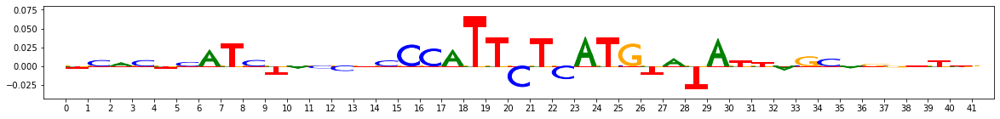

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 13 numseqlets 102


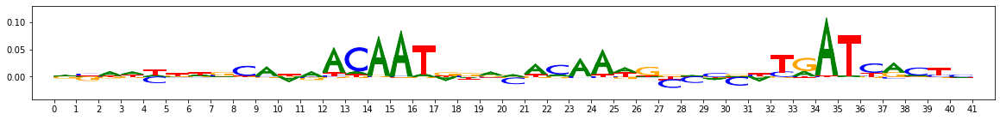

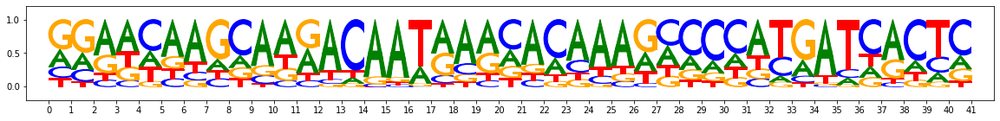

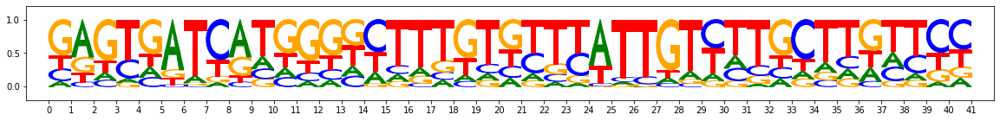

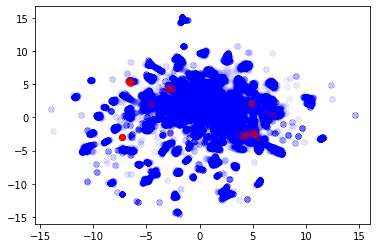

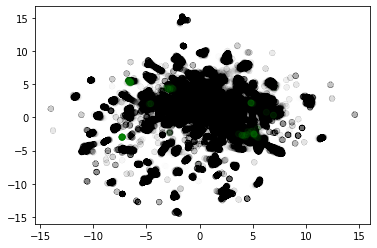

Chosen threshold: 0.9825841956773087 Precision: 0.25 Recall: 0.6972477064220184


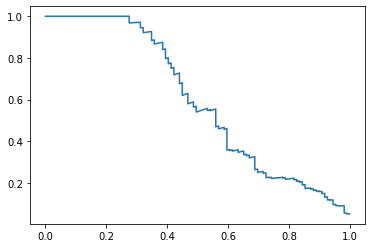

AuPRC: 0.5934941497885757
Reconstructed motif using threshold - numseqlets 296


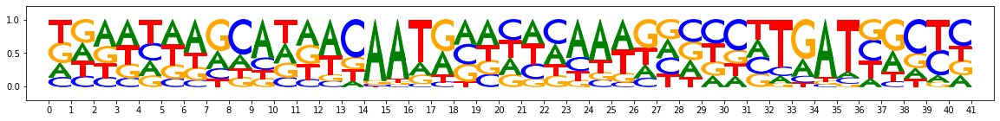

Reconstructed motif using argmax - numseqlets 3509


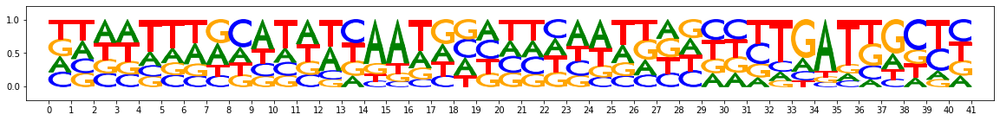

Sample false positive seqlets (argmax preds):
index 2 example:18558,start:463,end:504,rc:False
preds_proba [0.013 0.001 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.986 0.    0.   ]


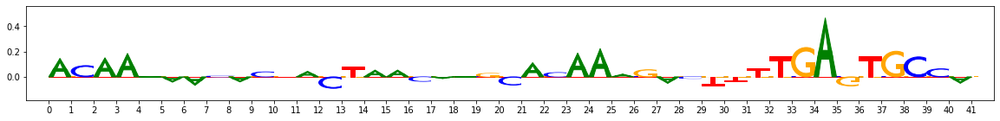

index 27372 example:3525,start:491,end:532,rc:True
preds_proba [0.067 0.    0.    0.    0.    0.004 0.    0.    0.    0.    0.    0.
 0.    0.    0.926 0.    0.   ]


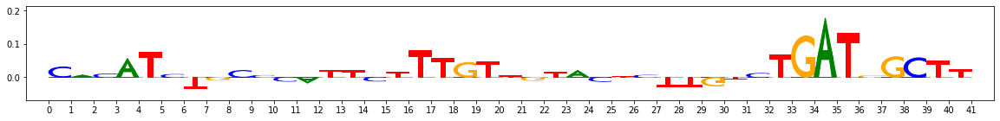

index 61752 example:16864,start:438,end:479,rc:False
preds_proba [0.174 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.823 0.001 0.   ]


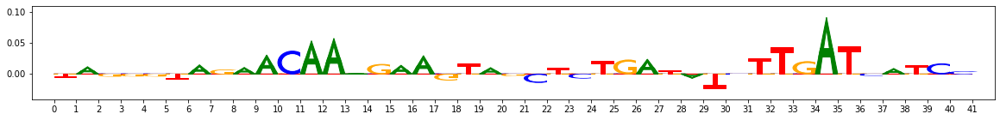

index 102815 example:13185,start:448,end:489,rc:False
preds_proba [0.25  0.    0.001 0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.001 0.    0.747 0.    0.   ]


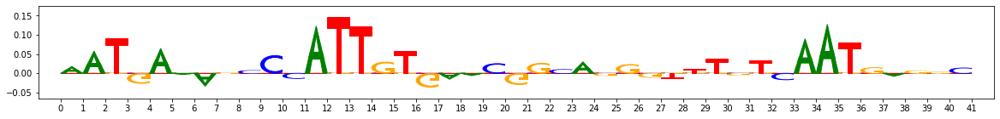

index 181782 example:3273,start:412,end:453,rc:True
preds_proba [0.477 0.    0.    0.    0.    0.001 0.    0.    0.    0.    0.001 0.
 0.    0.    0.521 0.    0.   ]


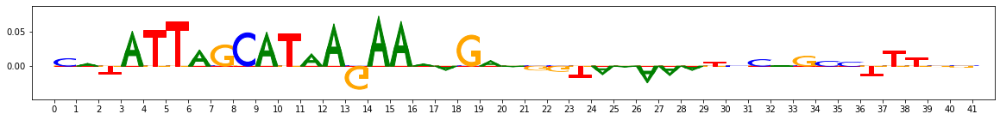

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 14 numseqlets 102


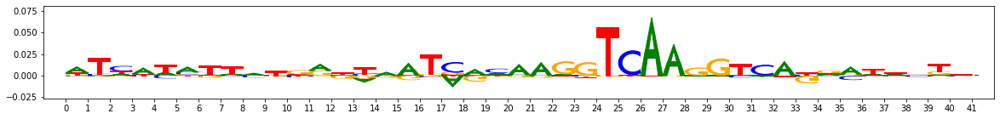

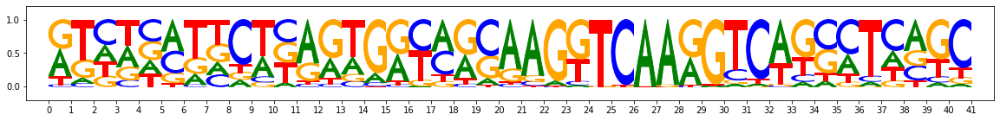

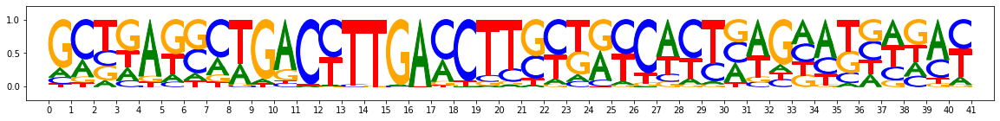

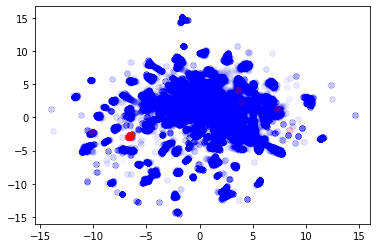

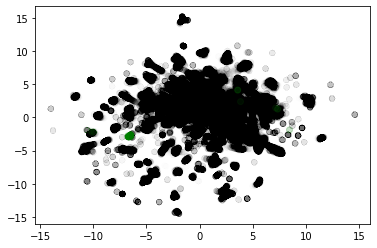

Chosen threshold: 0.998948470917102 Precision: 0.8452380952380952 Recall: 0.696078431372549


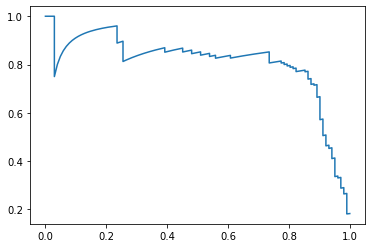

AuPRC: 0.8087761578238046
Reconstructed motif using threshold - numseqlets 84


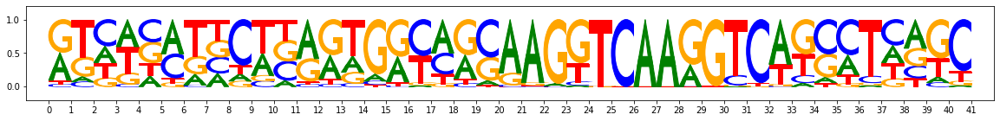

Reconstructed motif using argmax - numseqlets 1336


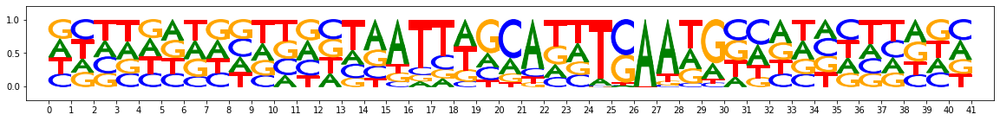

Sample false positive seqlets (argmax preds):
index 135 example:7822,start:481,end:522,rc:False
preds_proba [0.449 0.    0.001 0.    0.    0.001 0.    0.009 0.    0.    0.    0.001
 0.    0.    0.009 0.531 0.   ]


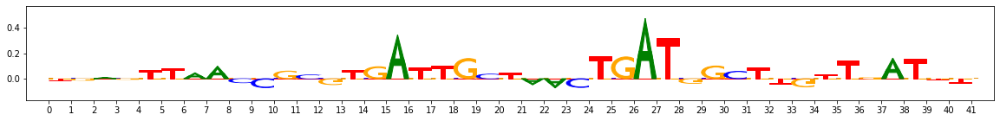

index 85522 example:2788,start:401,end:442,rc:False
preds_proba [0.047 0.    0.    0.    0.    0.001 0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.952 0.   ]


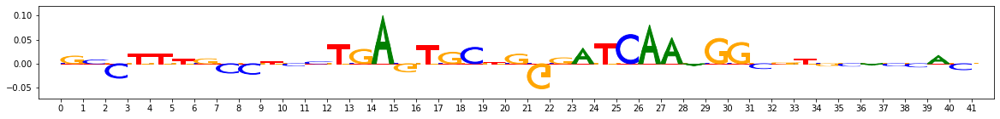

index 165494 example:7894,start:734,end:775,rc:True
preds_proba [0.448 0.    0.008 0.    0.001 0.    0.    0.    0.    0.    0.    0.
 0.    0.001 0.001 0.541 0.   ]


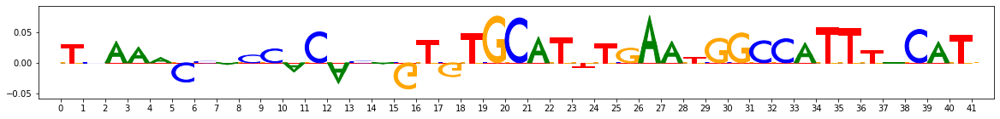

index 182880 example:1934,start:328,end:369,rc:False
preds_proba [0.275 0.    0.001 0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.723 0.   ]


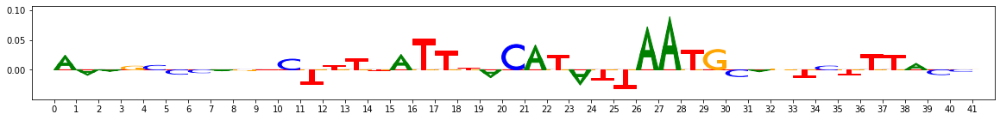

index 299113 example:16690,start:498,end:539,rc:False
preds_proba [0.416 0.    0.01  0.    0.    0.    0.    0.    0.    0.    0.    0.001
 0.    0.    0.    0.572 0.   ]


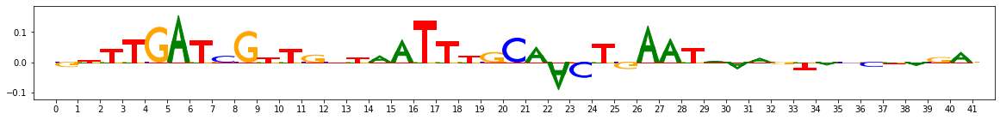

index 319405 example:17629,start:388,end:429,rc:False
preds_proba [0.462 0.001 0.012 0.004 0.    0.001 0.    0.002 0.    0.002 0.    0.001
 0.    0.001 0.004 0.51  0.   ]


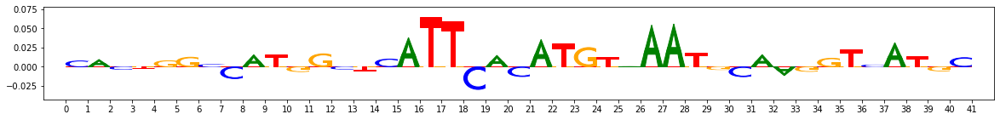

Sample false negative seqlets (argmax preds):
-------------------------------------------------------
PATTERNIDX 15 numseqlets 58


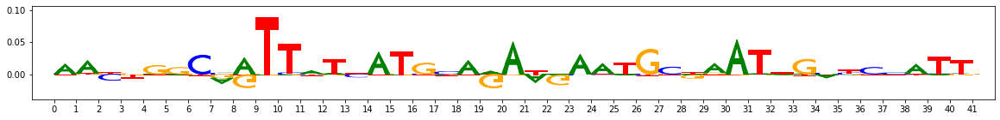

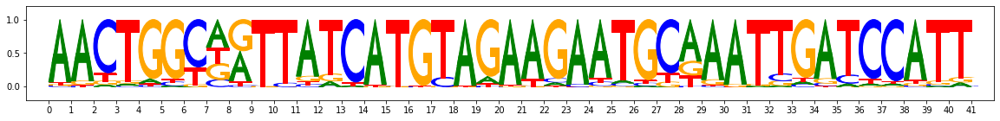

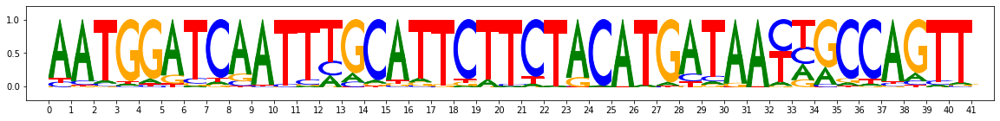

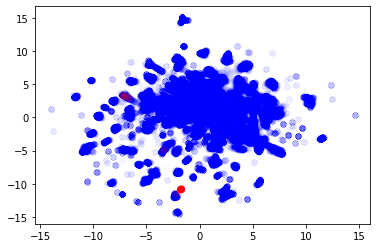

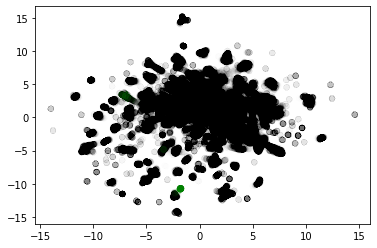

Chosen threshold: 0.9875152180892445 Precision: 0.9122807017543859 Recall: 0.8813559322033898


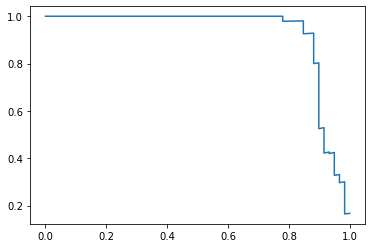

AuPRC: 0.9280928872516515
Reconstructed motif using threshold - numseqlets 56


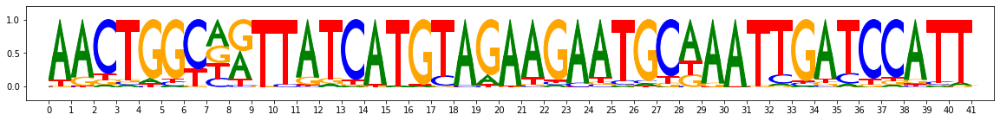

Reconstructed motif using argmax - numseqlets 1336


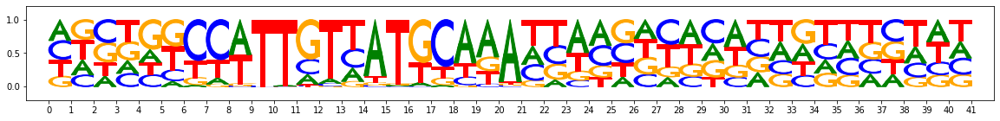

Sample false positive seqlets (argmax preds):
index 983 example:20,start:400,end:441,rc:True
preds_proba [0.316 0.    0.    0.11  0.001 0.    0.001 0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.571]


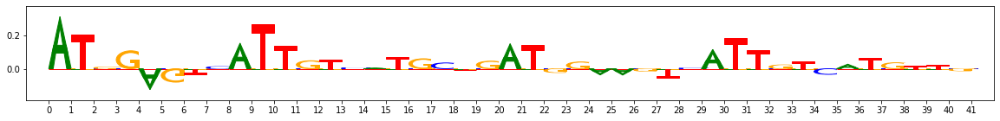

index 110568 example:18512,start:520,end:561,rc:False
preds_proba [0.011 0.    0.    0.002 0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.987]


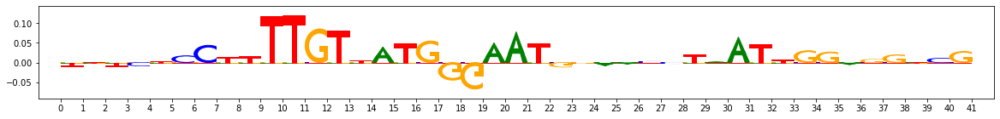

index 127656 example:4232,start:375,end:416,rc:True
preds_proba [0.148 0.    0.014 0.074 0.    0.001 0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.762]


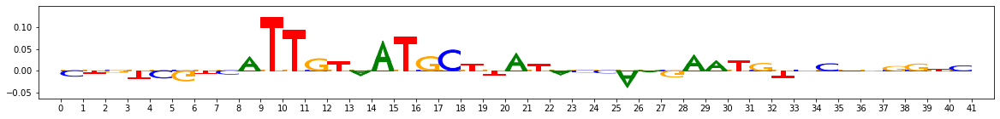

index 149018 example:1014,start:529,end:570,rc:False
preds_proba [0.263 0.    0.001 0.003 0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.001 0.    0.732]


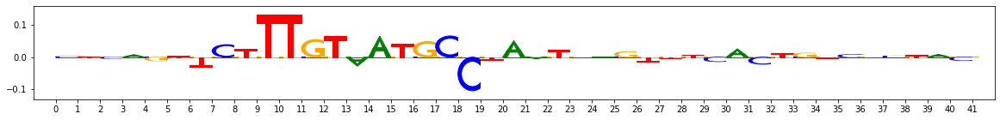

index 284975 example:4107,start:528,end:569,rc:True
preds_proba [0.327 0.    0.02  0.007 0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.646]


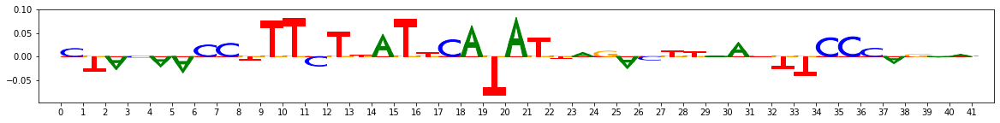

index 312928 example:7854,start:583,end:624,rc:True
preds_proba [0.383 0.    0.001 0.003 0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.611]


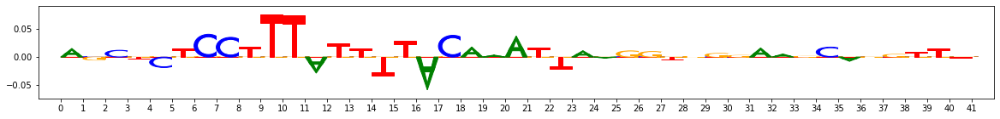

Sample false negative seqlets (argmax preds):


In [53]:
from matplotlib import pyplot as plt
from modisco.visualization import viz_sequence
from sklearn.metrics import (average_precision_score,
                             precision_recall_curve)

def plot_embedding(embedding, **kwargs):
    plt.scatter(*zip(*embedding),**kwargs)
    
def color_by_correctness(values):
    return ["black" if x==0 else "green" for x in values]

pattern_idx_to_chosen_thresh = {}
for pattern_idx in range(len(trimmed_patterns)):
    print("-------------------------------------------------------")
    print("PATTERNIDX", pattern_idx, "numseqlets", len(trimmed_patterns[pattern_idx].seqlets))
    viz_sequence.plot_weights(trimmed_patterns[pattern_idx]["Nanog_profile_wn_contrib_scores"].fwd)
    viz_sequence.plot_weights(trimmed_patterns[pattern_idx]["sequence"].fwd)
    viz_sequence.plot_weights(trimmed_patterns[pattern_idx]["sequence"].rev)
    plot_embedding(embedding[labels[:,pattern_idx]==0], alpha=0.003, color="blue")
    plot_embedding(embedding[labels[:,pattern_idx]==1], color="red", alpha=0.1)
    plt.show()
    plot_embedding(embedding[labels[:,pattern_idx]==0],
                   alpha=0.003,
                   c=color_by_correctness(
                      preds[labels[:,pattern_idx]==0]==(pattern_idx+1)))
    plot_embedding(embedding[labels[:,pattern_idx]==1],
                   alpha=0.1,
                   c=color_by_correctness(
                       preds[labels[:,pattern_idx]==1]==(pattern_idx+1)))
    plt.show()
    
    #plot the auPRC curve
    precision, recall, thresholds = precision_recall_curve(
                                        y_true=labels[:,pattern_idx],
                                        probas_pred=preds_proba[:,pattern_idx+1])
    RECALL_THRESHOLD = 0.7
    PREC_THRESHOLD = 0.9
    #Pick the max-recall threshold for which either recall <= 80% OR precision > 0.9
    thresh_prec, thresh_rec, thresh = max([x for x in zip(precision, recall, thresholds)
                                           if x[1] <= RECALL_THRESHOLD
                                              or x[0] >= PREC_THRESHOLD ],  key=lambda x: x[1])
    print("Chosen threshold:",thresh,"Precision:",thresh_prec,"Recall:",thresh_rec)
    pattern_idx_to_chosen_thresh[pattern_idx] = (thresh, thresh_prec, thresh_rec)
    
    plt.plot(recall, precision)
    plt.show()
    print("AuPRC:", average_precision_score(y_true=labels[:,pattern_idx],
                                            y_score=preds_proba[:,pattern_idx+1]))
    
    above_threshold_preds = preds_proba[:,pattern_idx+1] >= thresh
    argmax_preds = preds==pattern_idx+1
    
    reconstructed_motif_abovethresh = make_aggregated_seqlet(
        seqlets=[all_coordinates_seqlets[i] for i in np.nonzero(above_threshold_preds)[0]])
    reconstructed_motif_argmax = make_aggregated_seqlet(seqlets=[all_coordinates_seqlets[i] for i in
                                 np.nonzero(argmax_preds)[0]])
    
    print("Reconstructed motif using threshold - numseqlets",len(reconstructed_motif_abovethresh.seqlets))
    viz_sequence.plot_weights(reconstructed_motif_abovethresh["sequence"].fwd)
    print("Reconstructed motif using argmax - numseqlets",len(reconstructed_motif_argmax.seqlets))
    viz_sequence.plot_weights(reconstructed_motif_argmax["sequence"].fwd)
    
    #Visualize some false positives/false negatives at the default threshold
    false_positive_indices = np.nonzero((labels[:,pattern_idx]==0)*argmax_preds)[0]
    false_negative_indices = np.nonzero((labels[:,pattern_idx]==1)*(argmax_preds==0))[0]
    false_positive_seqlets = [all_coordinates_seqlets[i] for i in false_positive_indices]
    false_negative_seqlets = [all_coordinates_seqlets[i] for i in false_negative_indices]
    
    NUM_TO_VIZ = 5
    print("Sample false positive seqlets (argmax preds):")
    for i in range(0, len(false_positive_seqlets),
                   max(int(len(false_positive_seqlets)/NUM_TO_VIZ),1)):
        print("index",false_positive_indices[i],
              str(false_positive_seqlets[i].coor))
        print("preds_proba", np.round(preds_proba[false_positive_indices[i]],3))
        #print("Features:", features_matrix[false_positive_indices[i]])
        modisco.visualization.viz_sequence.plot_weights(
            false_positive_seqlets[i]["Nanog_profile_wn_contrib_scores"].fwd)
    
    print("Sample false negative seqlets (argmax preds):")
    for i in range(0, len(false_negative_seqlets),
                   max(int(len(false_negative_seqlets)/NUM_TO_VIZ),1) ):
        print("index",false_negative_indices[i],
              str(false_negative_seqlets[i].coor))
        print("preds_proba", np.round(preds_proba[false_negative_indices[i]],3) )
        #print("Features:", features_matrix[false_negative_indices[i]])
        modisco.visualization.viz_sequence.plot_weights(
            false_negative_seqlets[i]["Nanog_profile_wn_contrib_scores"].fwd)
        

In [ ]:
#Let's save all the info that is needed to do the hit scoring
#We need:
# (fordebug) trimmed_patterns
# exemplarmotifs_foreach_pattern
# allexemplarmotifs_impscoresdata_fwd
# per_position_ic_allexemplarmotifs_fwd
# A threshold on importance - could get from saved hdf5
# the weights of the multinomial logistic regression
# pattern_idx_to_chosen_thresh

In [81]:
loaded_tfmodisco_results.multitask_seqlet_creation_results.final_seqlets

 ...]

In [76]:
loaded_tfmodisco_results.multitask_seqlet_creation_results.multitask_seqlet_creator.coord_producer

In [ ]:
#Find coordinates in the full bpnet data


In [73]:
#let's figure out the seqlet threshold
dir(loaded_tfmodisco_results.multitask_seqlet_creation_results.task_name_to_coord_producer_results["Nanog/profile/wn"].tnt_results.pos_threshold)

loaded_tfmodisco_results.multitask_seqlet_creation_results.task_name_to_coord_producer_results["Nanog/profile/wn"].tnt_results.pos_threshold


0.3184376752376554

147973

In [18]:
len(onehot_seq)

55233

In [26]:
len(f["hyp_imp/Nanog/profile/wn"])

147974